<a href="https://colab.research.google.com/github/sakshamjn/Omdena-OVAC/blob/main/BangkokPost_SVM_Classifier_DR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bangkok Post - Scraping English Newspapers from Thailand



In [ ]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup as bs
import re
from random import random
import time

In [ ]:
import seaborn as sns

### Rubens' Parsing Function to extract Title, Body & Date from HTML







### TARGET CLASS (1/3) - ONLINE VIOLENCE AGAINST KIDS

In [ ]:
def getPage(url:str):
        try:
            article = requests.get(url)
        except requests.exceptions.RequestException:
            return None        
        return bs(article.content, "html.parser")

class TheAge:  

    def __init__(self, url:str):
        print(url) 
        self.soup = getPage(url)  
        self.body = self.get_body()
        self.title = self.get_title()
        self.date = self.get_date()
        
    def get_body(self) -> str: #('div',attrs={'class':'longText'})
        body = self.soup.find('div',attrs={'class':'articl-content'})#'bodyContent'})
        if body == None:
          return
        #return [p.text for p in body.find_all("p")]
        return  ' '.join([p.text for p in body.find_all("p")])
    
    def get_title(self) -> str:
        aux = self.soup.find("h2")
        if aux != None:
          return aux.text
        else:
          return None

    def get_date(self) -> str: 
      aux1 = self.soup.find("div", {"class":"p-info"})
      aux2 = self.soup.find("div", {"class":"col-15 col-md"}) #col-15 col-md
      if aux1 != None:
        return aux1.text#' '.join(re.findall('(\d{2}) ([a-zA-Z]+) (\d{4})', aux1.text)[0])
      elif aux2 != None:
        print('aqui', aux2.text)
        return aux2.text#' '.join(re.findall('(\d{2}) ([a-zA-Z]+) (\d{4})', aux2.text)[0])
      else:
        return None


    

In [ ]:
links = pd.read_csv("BP_OVAC2_GS.csv")

Date = []
Title = []
Article_Link = []
Article = []

# To track data loading
count = 0.0
total = len(links['Link'])

for link in links['Link']:
      time.sleep(1 + 3*random()) # between 1 and 4 seconds
      site = TheAge(link)
      Date.append(site.date)
      Title.append(site.title)
      Article_Link.append(link)
      Article.append(site.body)
      count += 1.0
      print('Load data at {}%'.format(round(100*(count/total),2)))

# Define a dictionary containing features of the data
# Convert it into DataFrame
df = pd.DataFrame({'Date':Date,
                   'Title':Title,
                   'Article_Link':Article_Link,
                   'Article':Article})

# Create a CSV file from the DataFrame
df.to_csv("BP_OVAC2_df.csv", index=False)

https://www.bangkokpost.com/life/social-and-lifestyle/1950500/to-catch-an-online-predator
Load data at 0.75%
https://www.bangkokpost.com/business/1459937/online-safety-for-children-is-everyones-responsibility
aqui 
published :
													7 May 2018 at 04:30												

Load data at 1.49%
https://www.bangkokpost.com/life/social-and-lifestyle/1392254/the-predator-next-door
Load data at 2.24%
https://www.bangkokpost.com/thailand/special-reports/1292363/online-task-force-closes-the-net-on-paedophiles
aqui 
published :
													23 Jul 2017 at 09:23												

Load data at 2.99%
https://www.bangkokpost.com/thailand/general/402373/swirly-face-predator-charged-again
aqui 
published :
													29 Mar 2014 at 09:12												

Load data at 3.73%
https://www.bangkokpost.com/business/1969943/dtac-joins-effort-to-push-e-learning-platform
aqui 
published :
													18 Aug 2020 at 04:00												

Load data at 4.48%
https://www.bangkokpost.com/business/1938840/get-a-grip-on-bullyi

In [ ]:
## Print the output

df
#df['Date'][0]
#df['Article_Link'][0]
#df['Article'][0]


,Date,Title,Article_Link,Article
0,published : 13 Jul 2020 at 10:30,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
1,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t7 May...,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2,published : 8 Jan 2018 at 04:30,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t23 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t29 Ma...,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...
...,...,...,...,...
129,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t10 Ja...,\n\t\t\t\t\t\t\t\t\t\t\tWhen school isn’t safe...,https://www.bangkokpost.com/thailand/special-r...,Bung* is in Mathayom 3 and is counting down th...
130,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t4 Sep...,\n\t\t\t\t\t\t\t\t\t\t\tCelebrity photo hacker...,https://www.bangkokpost.com/world/430440/celeb...,LOS ANGELES - Those behind the massive leak of...
131,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t16 Ma...,\n\t\t\t\t\t\t\t\t\t\t\tDiscipline our student...,https://www.bangkokpost.com/opinion/opinion/34...,Although corporal punishment was officially ba...
132,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t14 Ma...,"\n\t\t\t\t\t\t\t\t\t\t\tTeenagers, sex, alcoho...",https://www.bangkokpost.com/tech/340514/teenag...,A video of high school boys laughing about wat...


In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,published : 13 Jul 2020 at 10:30,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
1,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t7 May...,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2,published : 8 Jan 2018 at 04:30,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t23 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t29 Ma...,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files

df.to_csv('Bangkok_Post2.csv')
files.download('Bangkok_Post2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Bangkok_Post.csv?token=AN3DAR6FRP2BENORC6FF6TK7NHOVK'
df = pd.read_csv(url)
df.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,published : 13 Jul 2020 at 10:30,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
1,1,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t7 May...,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2,2,published : 8 Jan 2018 at 04:30,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
3,3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t23 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
4,4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t29 Ma...,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...


In [ ]:
BP_articles = df['Article']

In [ ]:
BP_articles

0      Sending a half-naked photo of herself to her n...
1      Shutting children away behind closed doors, aw...
2      Enticed by the pretty face who sent him a Face...
3      A schoolboy came to the police with a broken h...
4      VANCOUVER - A former Canadian schoolteacher wh...
                             ...                        
129    Bung* is in Mathayom 3 and is counting down th...
130    LOS ANGELES - Those behind the massive leak of...
131    Although corporal punishment was officially ba...
132    A video of high school boys laughing about wat...
133    When members of the House Committee on Educati...
Name: Article, Length: 134, dtype: object

In [ ]:
# join the 3 article texts one after another:

all_texts = ''
for text in BP_articles:
  all_texts += text

TypeError: ignored

In [ ]:
all_texts

'Sending a half-naked photo of herself to her new Facebook admirer, a boy she thought was 15, felt like a flirtatious move that 14-year-old Ned* believed would show she was serious about having a romantic relationship with the handsome teen whose photoshopped profile photo made him out to be a stud. Little did she realise that pressing the send button would lead to serious consequences because the young man who she believed she had fallen in love with was an online child predator looking to con young women into sending intimate photos in the guise of a blossoming romance. The next day, her suggestive photo was shared in a private Line group for paedophiles and just about anybody else interested in looking at lewd photos of young girls. The incident drove her into a state of depression, which was further exacerbated by the stress of having to keep up with her school lessons via remote learning at the height of Covid-19. She was overwhelmed with a sense of dread and the thought that such

In [ ]:
len(all_texts)

294983

In [ ]:
# Python program to generate WordCloud 
  
# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 

In [ ]:
# Create and generate a word cloud image:
wordcloud = WordCloud().generate(all_texts)

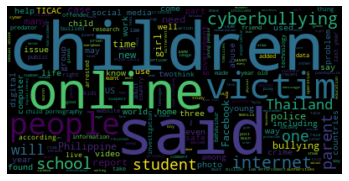

In [ ]:
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

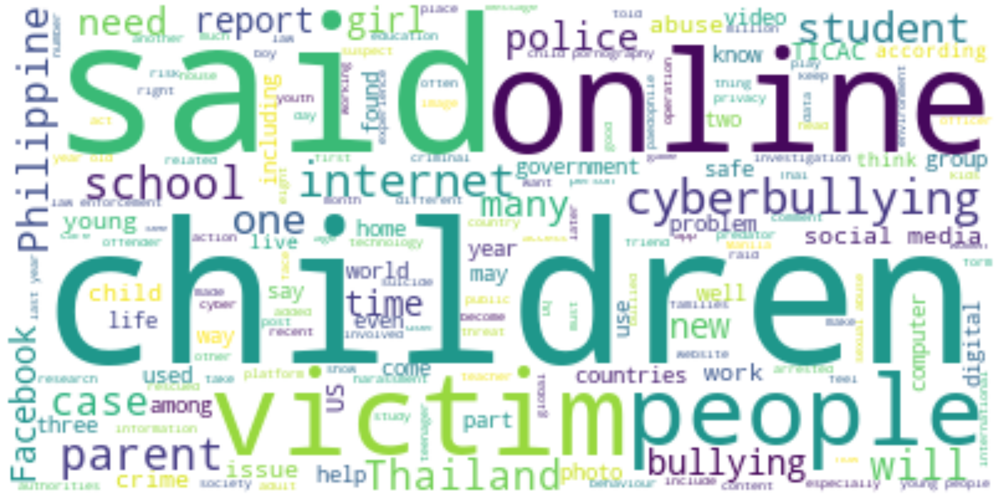

In [ ]:
# Create a word cloud image
wc = WordCloud(background_color="white", max_words=1000,
               contour_width=3, contour_color='yellow')      # stopwords=stopwords, contour_color='firebrick'

# Generate a wordcloud
wc.generate(all_texts)

# store to file
wc.to_file("BP_all_texts.png")

# show
plt.figure(figsize=[40,20])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

### Cleaning Datetime

In [ ]:
df['Date']

0                       published : 13 Jul 2020 at 10:30
1      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t7 May...
2                        published : 8 Jan 2018 at 04:30
3      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t23 Ju...
4      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t29 Ma...
                             ...                        
129    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t10 Ja...
130    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t4 Sep...
131    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t16 Ma...
132    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t14 Ma...
133    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t30 Ju...
Name: Date, Length: 134, dtype: object

In [ ]:
df['Date'] = df['Date'].str.lstrip() # didn't change anything ;) ...

df['Date'] = df['Date'].str.rstrip('\t')

In [ ]:
df['Date'] = df['Date'].str.replace('\t', '')
df['Date'] = df['Date'].str.replace('\n', '')

In [ ]:
df['Date'] = df['Date'].str.replace('published :', '')

In [ ]:
df['Date'] = df['Date'].str.replace('at ', '')

In [ ]:
df['Date']

0       13 Jul 2020 10:30
1        7 May 2018 04:30
2        8 Jan 2018 04:30
3       23 Jul 2017 09:23
4       29 Mar 2014 09:12
              ...        
129     10 Jan 2016 01:51
130      4 Sep 2014 09:45
131     16 Mar 2013 00:00
132     14 Mar 2013 19:49
133     30 Jun 2012 00:00
Name: Date, Length: 134, dtype: object

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

In [ ]:
df['Date']

0     2020-07-13 10:30:00
1     2018-05-07 04:30:00
2     2018-01-08 04:30:00
3     2017-07-23 09:23:00
4     2014-03-29 09:12:00
              ...        
129   2016-01-10 01:51:00
130   2014-09-04 09:45:00
131   2013-03-16 00:00:00
132   2013-03-14 19:49:00
133   2012-06-30 00:00:00
Name: Date, Length: 134, dtype: datetime64[ns]

In [ ]:
# where do my 9 NAN come from ??

df['Date'].isna().sum()

13

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...


In [ ]:
df = df.set_index(df['Date']) 

In [ ]:
df.head()

,Unnamed: 0,Date,Title,Article_Link,Article
Date,,,,,
2020-07-13 10:30:00,0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
2018-05-07 04:30:00,1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2018-01-08 04:30:00,2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
2017-07-23 09:23:00,3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
2014-03-29 09:12:00,4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...


In [ ]:
yearly = df.resample("Y").count()

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2011,2,2,2,2
2012,2,2,2,2
2013,3,3,3,3
2014,17,17,17,17
2015,7,7,7,7
2016,3,3,3,3
2017,3,3,3,3
2018,7,7,7,7
2019,7,7,7,7


In [ ]:
yearly.index = yearly.index.year

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2011,2,2,2,2
2012,2,2,2,2
2013,3,3,3,3
2014,17,17,17,17
2015,7,7,7,7
2016,3,3,3,3
2017,3,3,3,3
2018,7,7,7,7
2019,7,7,7,7


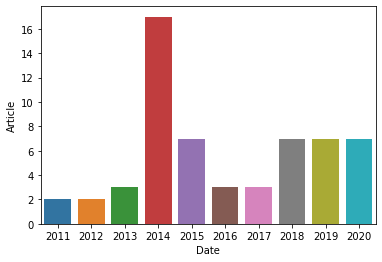

In [ ]:
sns.barplot(yearly.index,yearly.Article)

In [ ]:
df.isna().sum()

Unnamed: 0      0
Date            6
Title           0
Article_Link    0
Article         0
dtype: int64

In [ ]:
# could also be a string of 1 space or so. not necessarily missing value!

df.isnull().sum()     

Unnamed: 0      0
Date            6
Title           0
Article_Link    0
Article         0
dtype: int64

In [ ]:
from google.colab import files

df.to_csv('Bangkok_Post_OVAC2.csv')
files.download('Bangkok_Post_OVAC2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df

,Date,Title,Article_Link,Article
0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...
...,...,...,...,...
129,2016-01-10 01:51:00,\n\t\t\t\t\t\t\t\t\t\t\tWhen school isn’t safe...,https://www.bangkokpost.com/thailand/special-r...,Bung* is in Mathayom 3 and is counting down th...
130,2014-09-04 09:45:00,\n\t\t\t\t\t\t\t\t\t\t\tCelebrity photo hacker...,https://www.bangkokpost.com/world/430440/celeb...,LOS ANGELES - Those behind the massive leak of...
131,2013-03-16 00:00:00,\n\t\t\t\t\t\t\t\t\t\t\tDiscipline our student...,https://www.bangkokpost.com/opinion/opinion/34...,Although corporal punishment was officially ba...
132,2013-03-14 19:49:00,"\n\t\t\t\t\t\t\t\t\t\t\tTeenagers, sex, alcoho...",https://www.bangkokpost.com/tech/340514/teenag...,A video of high school boys laughing about wat...


### CLASS 2/3 - ONLINE VIOLENCE AGAINST adults

In [ ]:
links = pd.read_csv("BP_OVAA2_GS.csv")

Date = []
Title = []
Article_Link = []
Article = []

# To track data loading
count = 0.0
total = len(links['Link'])

for link in links['Link']:
      time.sleep(1 + 3*random()) # between 1 and 4 seconds
      site = TheAge(link)
      Date.append(site.date)
      Title.append(site.title)
      Article_Link.append(link)
      Article.append(site.body)
      count += 1.0
      print('Load data at {}%'.format(round(100*(count/total),2)))

# Define a dictionary containing features of the data
# Convert it into DataFrame
df = pd.DataFrame({'Date':Date,
                   'Title':Title,
                   'Article_Link':Article_Link,
                   'Article':Article})

# Create a CSV file from the DataFrame
df.to_csv("BP_OVAA2_df.csv", index=False)

https://www.bangkokpost.com/learning/learning-entertainment/1303715/to-die-for
Load data at 2.78%
https://www.bangkokpost.com/opinion/opinion/1303415/facebook-too-big-a-platform-to-allow-fake-users
aqui 





Leonid Bershidsky
Bloomberg View columnist



Load data at 5.56%
https://www.bangkokpost.com/opinion/opinion/1133365/the-flipside-to-nott
aqui 





Editorial 
Bangkok Post editorial column



Load data at 8.33%
https://www.bangkokpost.com/tech/536267/twitter-moves-to-stem-violent-threats-abuse
aqui 
published :
													22 Apr 2015 at 01:45												

Load data at 11.11%
https://www.bangkokpost.com/world/432970/philippine-agents-arrest-43-in-cybersex-raids
aqui 
published :
													18 Sep 2014 at 21:09												

Load data at 13.89%
https://www.bangkokpost.com/tech/215528/philippine-police-arrest-36-in-cybersex-raid
aqui 
published :
													11 Jan 2011 at 14:30												

Load data at 16.67%
https://www.bangkokpost.com/thailand/general/1909560/cops-nab-online

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,None,Learn from listening,https://www.bangkokpost.com/learning/learning-...,None
1,\n\n\n\n\n\nLeonid Bershidsky\nBloomberg View ...,\n\t\t\t\t\t\t\t\t\t\t\tFacebook too big a pla...,https://www.bangkokpost.com/opinion/opinion/13...,There's something in common between the amazin...
2,\n\n\n\n\n\nEditorial \nBangkok Post editorial...,\n\t\t\t\t\t\t\t\t\t\t\tThe flipside to 'Nott'...,https://www.bangkokpost.com/opinion/opinion/11...,As social media becomes the bright shining too...
3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t22 Ap...,\n\t\t\t\t\t\t\t\t\t\t\tTwitter moves to stem ...,https://www.bangkokpost.com/tech/536267/twitte...,WASHINGTON - Twitter on Tuesday began implemen...
4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Se...,\n\t\t\t\t\t\t\t\t\t\t\tPhilippines arrests 43...,https://www.bangkokpost.com/world/432970/phili...,MANILA — Philippine authorities say they have ...


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files

df.to_csv('Bangkok_Post_OVAA2.csv')
files.download('Bangkok_Post_OVAA2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Bangkok_Post_OVAA.csv?token=AN3DAR37JDSVG6F2PDAFR6C7NHPUQ'
BP_OVAA = pd.read_csv(url)
BP_OVAA.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,NaN,Learn from listening,https://www.bangkokpost.com/learning/learning-...,NaN
1,1,\n\n\n\n\n\nLeonid Bershidsky\nBloomberg View ...,\n\t\t\t\t\t\t\t\t\t\t\tFacebook too big a pla...,https://www.bangkokpost.com/opinion/opinion/13...,There's something in common between the amazin...
2,2,\n\n\n\n\n\nEditorial \nBangkok Post editorial...,\n\t\t\t\t\t\t\t\t\t\t\tThe flipside to 'Nott'...,https://www.bangkokpost.com/opinion/opinion/11...,As social media becomes the bright shining too...
3,3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t22 Ap...,\n\t\t\t\t\t\t\t\t\t\t\tTwitter moves to stem ...,https://www.bangkokpost.com/tech/536267/twitte...,WASHINGTON - Twitter on Tuesday began implemen...
4,4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Se...,\n\t\t\t\t\t\t\t\t\t\t\tPhilippines arrests 43...,https://www.bangkokpost.com/world/432970/phili...,MANILA — Philippine authorities say they have ...


In [ ]:
BP_articles = df['Article']

In [ ]:
BP_articles

0                                                  None
1     There's something in common between the amazin...
2     As social media becomes the bright shining too...
3     WASHINGTON - Twitter on Tuesday began implemen...
4     MANILA — Philippine authorities say they have ...
5     Thirty-six people have been arrested in the Ph...
6     CHIANG MAI: A man who allegedly posed as a wom...
7     The US immigration officer told a young Colomb...
8     WASHINGTON - Google said Friday it was taking ...
9     Fifty-eight people have been arrested in the P...
10    Federal investigators in California arrested a...
11    SEOUL: Fans mourned and questions were asked M...
12    SEOUL: K-pop star Jung Joon-young has been arr...
13    SAN FRANCISCO - Facebook Inc is adding tools o...
14    SINGAPORE: Sexual harassment and assaults agai...
15    WASHINGTON - Microsoft announced Wednesday it ...
16    As a corporate employee, I feel privileged tha...
17    K-pop singer Koo Hara left a "pessimistic"

In [ ]:
# join the 3 article texts one after another:

all_texts = ''
for text in BP_articles[1:-1]:
  all_texts += text

In [ ]:
all_texts

'There\'s something in common between the amazing story of "Nicole Mincey", the pseudonymous Twitter user with 146,000 followers who was retweeted by US President Donald Trump and then disappeared overnight along with a few other online personae, and a recent prank by a Berliner frustrated with his inability to get Twitter to remove hate speech. The common element is the obvious solution to both problems, which rarely surfaces in discussions of trolling, fake news and cyberbullying. Social networks should be obliged to ban anonymous accounts. If they refuse to do so voluntarily, government regulators should force the issue. Nicole Mincey was apparently a fake African-American identity that helped sell Trump-related merchandise online. It was part of an enterprise supported by pro-Trump social media posts from several fake accounts representing people whose backgrounds, looks (illegally used stock photos, actually) and views might appeal to potential buyers. The whole scam blew up after

In [ ]:
len(all_texts)

46964

In [ ]:
# Python program to generate WordCloud 
  
# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 

In [ ]:
# Create and generate a word cloud image:
wordcloud = WordCloud().generate(all_texts)

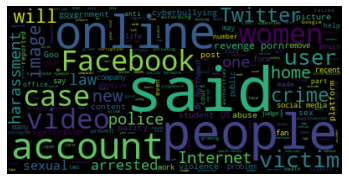

In [ ]:
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

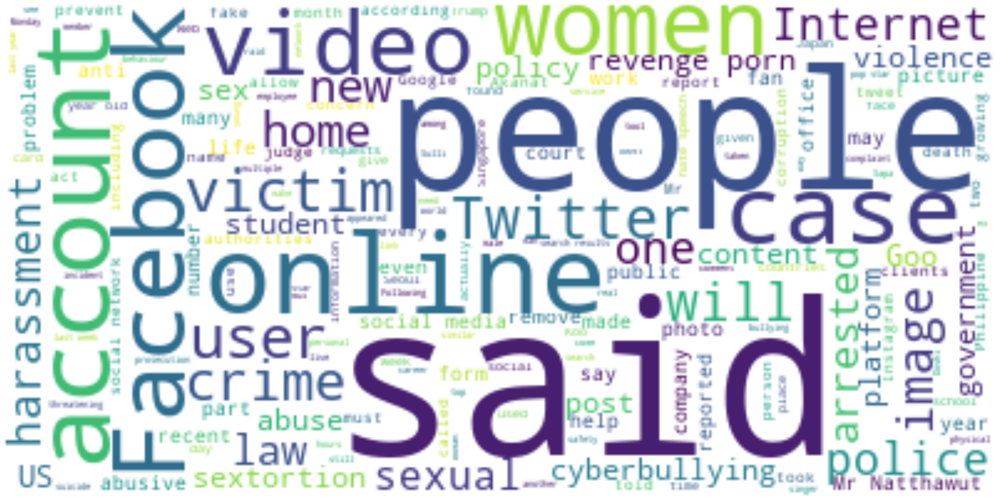

In [ ]:
# Create a word cloud image
wc = WordCloud(background_color="white", max_words=1000,
               contour_width=3, contour_color='yellow')      # stopwords=stopwords, contour_color='firebrick'

# Generate a wordcloud
wc.generate(all_texts)

# store to file
wc.to_file("BP_all_texts.png")

# show
plt.figure(figsize=[40,20])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
df = BP_OVAA

### Cleaning Datetime

In [ ]:
df['Date']

0                                                  None
1     \n\n\n\n\n\nLeonid Bershidsky\nBloomberg View ...
2     \n\n\n\n\n\nEditorial \nBangkok Post editorial...
3     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t22 Ap...
4     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Se...
5     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t11 Ja...
6     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t29 Ap...
7     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t21 Se...
8     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t20 Ju...
9     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t2 May...
10    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t27 Se...
11    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t25 No...
12    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t22 Ma...
13    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t5 Apr...
14    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t24 Au...
15    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t22 Ju...
16    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t16 Au...
17    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t2

In [ ]:
df['Date'] = df['Date'].str.lstrip() # didn't change anything ;) ...

df['Date'] = df['Date'].str.rstrip('\t')

In [ ]:
df['Date'] = df['Date'].str.replace('\t', '')
df['Date'] = df['Date'].str.replace('\n', '')

In [ ]:
df['Date'] = df['Date'].str.replace('published :', '')

In [ ]:
df['Date'] = df['Date'].str.replace('at ', '')

In [ ]:
df['Date']

0                                          None
1     Leonid BershidskyBloomberg View columnist
2       Editorial Bangkok Post editorial column
3                             22 Apr 2015 01:45
4                             18 Sep 2014 21:09
5                             11 Jan 2011 14:30
6                             29 Apr 2020 04:00
7                             21 Sep 2015 03:47
8                             20 Jun 2015 04:44
9                              2 May 2014 10:49
10                            27 Sep 2013 10:49
11                            25 Nov 2019 11:45
12                            22 Mar 2019 07:45
13                             5 Apr 2017 20:57
14                            24 Aug 2020 11:45
15                            22 Jul 2015 23:43
16                            16 Aug 2016 05:45
17                            22 Jul 2015 23:43
18    Glenn ChapmanAFP technology correspondent
19                            19 Jul 2015 15:43
20                            17 Jul 201

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

In [ ]:
df['Date']

0                    NaT
1                    NaT
2                    NaT
3    2015-04-22 01:45:00
4    2014-09-18 21:09:00
5    2011-01-11 14:30:00
6    2020-04-29 04:00:00
7    2015-09-21 03:47:00
8    2015-06-20 04:44:00
9    2014-05-02 10:49:00
10   2013-09-27 10:49:00
11   2019-11-25 11:45:00
12   2019-03-22 07:45:00
13   2017-04-05 20:57:00
14   2020-08-24 11:45:00
15   2015-07-22 23:43:00
16   2016-08-16 05:45:00
17   2015-07-22 23:43:00
18                   NaT
19   2015-07-19 15:43:00
20   2015-07-17 18:43:00
21   2015-07-09 05:43:00
22   2015-06-20 04:44:00
23   2015-04-17 02:37:00
24   2015-04-04 09:45:00
25   2015-03-12 22:44:00
26   2015-02-20 01:25:00
27   2015-02-03 09:45:00
28   2014-10-21 16:44:00
29   2013-12-11 07:49:00
30   2013-05-24 14:49:00
31                   NaT
32   2019-11-27 04:00:00
33                   NaT
34   2019-10-11 11:45:00
35   2015-04-12 15:24:00
Name: Date, dtype: datetime64[ns]

In [ ]:
# where do my 9 NAN come from ??

df['Date'].isna().sum()

6

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,NaT,Learn from listening,https://www.bangkokpost.com/learning/learning-...,None
1,NaT,\n\t\t\t\t\t\t\t\t\t\t\tFacebook too big a pla...,https://www.bangkokpost.com/opinion/opinion/13...,There's something in common between the amazin...
2,NaT,\n\t\t\t\t\t\t\t\t\t\t\tThe flipside to 'Nott'...,https://www.bangkokpost.com/opinion/opinion/11...,As social media becomes the bright shining too...
3,2015-04-22 01:45:00,\n\t\t\t\t\t\t\t\t\t\t\tTwitter moves to stem ...,https://www.bangkokpost.com/tech/536267/twitte...,WASHINGTON - Twitter on Tuesday began implemen...
4,2014-09-18 21:09:00,\n\t\t\t\t\t\t\t\t\t\t\tPhilippines arrests 43...,https://www.bangkokpost.com/world/432970/phili...,MANILA — Philippine authorities say they have ...


In [ ]:
df = df.set_index(df['Date'])

In [ ]:
df.head()

,Unnamed: 0,Date,Title,Article_Link,Article
Date,,,,,
NaT,0,NaT,Learn from listening,https://www.bangkokpost.com/learning/learning-...,NaN
NaT,1,NaT,\n\t\t\t\t\t\t\t\t\t\t\tFacebook too big a pla...,https://www.bangkokpost.com/opinion/opinion/13...,There's something in common between the amazin...
NaT,2,NaT,\n\t\t\t\t\t\t\t\t\t\t\tThe flipside to 'Nott'...,https://www.bangkokpost.com/opinion/opinion/11...,As social media becomes the bright shining too...
2015-04-22 01:45:00,3,2015-04-22 01:45:00,\n\t\t\t\t\t\t\t\t\t\t\tTwitter moves to stem ...,https://www.bangkokpost.com/tech/536267/twitte...,WASHINGTON - Twitter on Tuesday began implemen...
2014-09-18 21:09:00,4,2014-09-18 21:09:00,\n\t\t\t\t\t\t\t\t\t\t\tPhilippines arrests 43...,https://www.bangkokpost.com/world/432970/phili...,MANILA — Philippine authorities say they have ...


In [ ]:
yearly = df.resample("Y").count()

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2011-12-31,1,1,1,1
2012-12-31,0,0,0,0
2013-12-31,1,1,1,1
2014-12-31,2,2,2,2
2015-12-31,4,4,4,4
2016-12-31,0,0,0,0
2017-12-31,1,1,1,1
2018-12-31,0,0,0,0
2019-12-31,3,3,3,3


In [ ]:
yearly.index = yearly.index.year

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2011,1,1,1,1
2012,0,0,0,0
2013,1,1,1,1
2014,2,2,2,2
2015,4,4,4,4
2016,0,0,0,0
2017,1,1,1,1
2018,0,0,0,0
2019,3,3,3,3


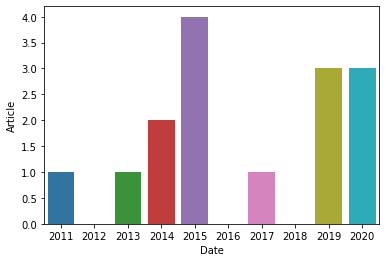

In [ ]:
sns.barplot(yearly.index,yearly.Article)

In [ ]:
from google.colab import files

df.to_csv('Bangkok_Post_OVAA2.csv')
files.download('Bangkok_Post_OVAA2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### CLASS 3/3 - physical VIOLENCE AGAINST CHILDREN

In [ ]:
links = pd.read_csv("BP_PVAC2_GS.csv")

Date = []
Title = []
Article_Link = []
Article = []

# To track data loading
count = 0.0
total = len(links['Link'])

for link in links['Link']:
      time.sleep(1 + 3*random()) # between 1 and 4 seconds
      site = TheAge(link)
      Date.append(site.date)
      Title.append(site.title)
      Article_Link.append(link)
      Article.append(site.body)
      count += 1.0
      print('Load data at {}%'.format(round(100*(count/total),2)))

# Define a dictionary containing features of the data
# Convert it into DataFrame
df = pd.DataFrame({'Date':Date,
                   'Title':Title,
                   'Article_Link':Article_Link,
                   'Article':Article})

# Create a CSV file from the DataFrame
df.to_csv("BP_PVAC2_GS_df.csv", index=False)

https://www.bangkokpost.com/business/1958095/pandemic-of-abuse
aqui 
published :
													27 Jul 2020 at 12:30												

Load data at 2.27%
https://www.bangkokpost.com/life/social-and-lifestyle/1839504/an-imbalance-of-power
Load data at 4.55%
https://www.bangkokpost.com/thailand/general/1195113/vile-uk-paedophile-receives-13-life-sentences
aqui 
published :
													9 Feb 2017 at 03:12												

Load data at 6.82%
https://www.bangkokpost.com/world/1958875/police-search-german-allotment-garden-in-madeleine-mccann-case
aqui 
published :
													28 Jul 2020 at 20:45												

Load data at 9.09%
https://www.bangkokpost.com/thailand/general/1946232/reenactment-of-child-rape-sparks-anger
aqui 
published :
													6 Jul 2020 at 04:30												

Load data at 11.36%
https://www.bangkokpost.com/learning/easy/1941556/man-held-for-child-rape-claims-girl-fell-in-love-with-him
Load data at 13.64%
https://www.bangkokpost.com/life/social-and-lifestyle/1935600/fighting-a-sh

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t27 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tPandemic of abuse\t\t\...,https://www.bangkokpost.com/business/1958095/p...,Stay-at-home and lockdown measures have helped...
1,published : 20 Jan 2020 at 04:31,An imbalance of power,https://www.bangkokpost.com/life/social-and-li...,"After K-pop singer Lalisa Manoban, better know..."
2,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t9 Feb...,\n\t\t\t\t\t\t\t\t\t\t\t'Vile' UK paedophile r...,https://www.bangkokpost.com/thailand/general/1...,LONDON - A retired English teacher was jailed ...
3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t28 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://www.bangkokpost.com/world/1958875/poli...,BERLIN - Police are searching an allotment plo...
4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t6 Jul...,\n\t\t\t\t\t\t\t\t\t\t\tReenactment of child r...,https://www.bangkokpost.com/thailand/general/1...,A Myanmar man who raped and choked a five-year...


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files

df.to_csv('Bangkok_Post_PVAC2.csv')
files.download('Bangkok_Post_PVAC2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Bangkok_Post_PVAC.csv?token=AN3DAR6GFRCQDWS7PILNQ7K7NHP7E'
BP_PVAC = pd.read_csv(url)
BP_PVAC.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t27 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tPandemic of abuse\t\t\...,https://www.bangkokpost.com/business/1958095/p...,Stay-at-home and lockdown measures have helped...
1,1,published : 20 Jan 2020 at 04:31,An imbalance of power,https://www.bangkokpost.com/life/social-and-li...,"After K-pop singer Lalisa Manoban, better know..."
2,2,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t9 Feb...,\n\t\t\t\t\t\t\t\t\t\t\t'Vile' UK paedophile r...,https://www.bangkokpost.com/thailand/general/1...,LONDON - A retired English teacher was jailed ...
3,3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t28 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://www.bangkokpost.com/world/1958875/poli...,BERLIN - Police are searching an allotment plo...
4,4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t6 Jul...,\n\t\t\t\t\t\t\t\t\t\t\tReenactment of child r...,https://www.bangkokpost.com/thailand/general/1...,A Myanmar man who raped and choked a five-year...


In [ ]:
df['Article']

0     Stay-at-home and lockdown measures have helped...
1     After K-pop singer Lalisa Manoban, better know...
2     LONDON - A retired English teacher was jailed ...
3     BERLIN - Police are searching an allotment plo...
4     A Myanmar man who raped and choked a five-year...
5                                                  None
6     Working from home during the height of Covid-1...
7     BURI RAM: A 43-year-old man has been arrested ...
8     A recent rape case in Mukdahan province shocke...
9     Education Minister Nataphol Teepsuwan on Monda...
10    The three child sexual abuses cases which have...
11    NAKHON RATCHASIMA: A husband and wife locked i...
12    NAKHON RATCHASIMA: Police yesterday pressed ra...
13    NAKHON RATCHASIMA: A male lecturer at a univer...
14    The United Nations Children's Fund (Unicef) ha...
15    SEOUL: South Korea has raised the age of conse...
16    Respected child rights advocate Ticha Na Nagar...
17    Three teachers from a total of seven suspe

In [ ]:
# join the 3 article texts one after another:

all_texts1 = ''
for text in BP_articles[0:4]:
  all_texts1 += text

In [ ]:
all_texts2 = ''
for text in BP_articles[6:-1]:
  all_texts2 += text

In [ ]:
all_texts = pd.concat(all_texts1, all_texts2)

TypeError: ignored

In [ ]:
all_texts

'There\'s something in common between the amazing story of "Nicole Mincey", the pseudonymous Twitter user with 146,000 followers who was retweeted by US President Donald Trump and then disappeared overnight along with a few other online personae, and a recent prank by a Berliner frustrated with his inability to get Twitter to remove hate speech. The common element is the obvious solution to both problems, which rarely surfaces in discussions of trolling, fake news and cyberbullying. Social networks should be obliged to ban anonymous accounts. If they refuse to do so voluntarily, government regulators should force the issue. Nicole Mincey was apparently a fake African-American identity that helped sell Trump-related merchandise online. It was part of an enterprise supported by pro-Trump social media posts from several fake accounts representing people whose backgrounds, looks (illegally used stock photos, actually) and views might appeal to potential buyers. The whole scam blew up after

In [ ]:
len(all_texts)

46964

In [ ]:
# Python program to generate WordCloud 
  
# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 

In [ ]:
# Create and generate a word cloud image:
wordcloud = WordCloud().generate(all_texts)

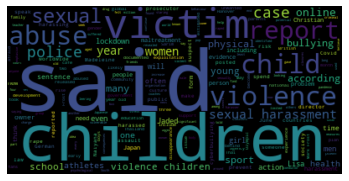

In [ ]:
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

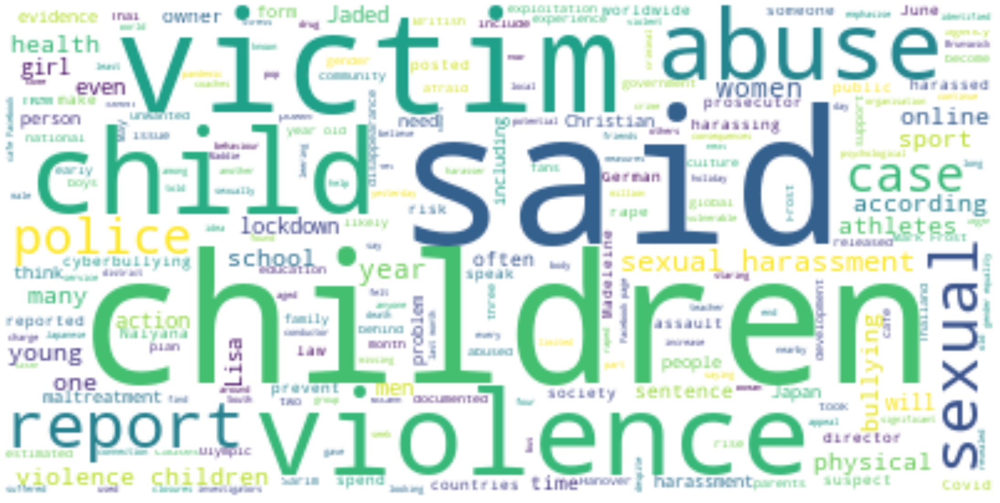

In [ ]:
# Create a word cloud image
wc = WordCloud(background_color="white", max_words=1000,
               contour_width=3, contour_color='yellow')      # stopwords=stopwords, contour_color='firebrick'

# Generate a wordcloud
wc.generate(all_texts)

# store to file
wc.to_file("BP_all_texts.png")

# show
plt.figure(figsize=[40,20])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
df = BP_PVAC

### Cleaning Datetime

In [ ]:
df['Date']

0     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t27 Ju...
1                      published : 20 Jan 2020 at 04:31
2     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t9 Feb...
3     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t28 Ju...
4     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t6 Jul...
5                                                  None
6                      published : 16 Jun 2020 at 04:00
7     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t11 Ju...
8                       published : 1 Jun 2020 at 04:30
9     \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t26 Ma...
10    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t24 Ma...
11    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t19 Ma...
12    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t19 Ma...
13    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Ma...
14    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t14 Ma...
15    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t13 Ma...
16    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t13 Ma...
17    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t1

In [ ]:
df['Date'] = df['Date'].str.lstrip() # didn't change anything ;) ...

df['Date'] = df['Date'].str.rstrip('\t')

In [ ]:
df['Date'] = df['Date'].str.replace('\t', '')
df['Date'] = df['Date'].str.replace('\n', '')

In [ ]:
df['Date'] = df['Date'].str.replace('published :', '')

In [ ]:
df['Date'] = df['Date'].str.replace('at ', '')

In [ ]:
df['Date']

0                                     27 Jul 2020 12:30
1                                     20 Jan 2020 04:31
2                                      9 Feb 2017 03:12
3                                     28 Jul 2020 20:45
4                                      6 Jul 2020 04:30
5                                                  None
6                                     16 Jun 2020 04:00
7                                     11 Jun 2020 12:53
8                                      1 Jun 2020 04:30
9                                     26 May 2020 05:00
10                                    24 May 2020 07:00
11                                    19 May 2020 12:01
12                                    19 May 2020 04:00
13                                    18 May 2020 15:15
14                                    14 May 2020 04:00
15                                    13 May 2020 12:45
16                                    13 May 2020 07:07
17                                    12 May 202

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

In [ ]:
df['Date']

0    2020-07-27 12:30:00
1    2020-01-20 04:31:00
2    2017-02-09 03:12:00
3    2020-07-28 20:45:00
4    2020-07-06 04:30:00
5                    NaT
6    2020-06-16 04:00:00
7    2020-06-11 12:53:00
8    2020-06-01 04:30:00
9    2020-05-26 05:00:00
10   2020-05-24 07:00:00
11   2020-05-19 12:01:00
12   2020-05-19 04:00:00
13   2020-05-18 15:15:00
14   2020-05-14 04:00:00
15   2020-05-13 12:45:00
16   2020-05-13 07:07:00
17   2020-05-12 07:00:00
18   2020-02-14 08:46:00
19   2020-02-07 13:45:00
20   2020-01-14 17:39:00
21   2019-11-08 04:01:00
22   2014-09-09 06:00:00
23   2012-03-04 00:00:00
24   2020-07-28 20:45:00
25   2020-06-12 00:45:00
26   2020-06-04 19:45:00
27   2019-11-02 04:00:00
28   2019-10-08 04:00:00
29   2019-09-28 18:05:00
30   2019-09-28 06:22:00
31   2019-08-15 01:45:00
32   2019-07-20 18:26:00
33   2018-12-19 13:15:00
34   2018-12-13 12:45:00
35                   NaT
36   2018-10-04 07:04:00
37                   NaT
38   2017-02-22 18:55:00
39   2016-04-05 17:15:00


In [ ]:
# where do my 9 NAN come from ??

df['Date'].isna().sum()

4

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,2020-07-27 12:30:00,\n\t\t\t\t\t\t\t\t\t\t\tPandemic of abuse\t\t\...,https://www.bangkokpost.com/business/1958095/p...,Stay-at-home and lockdown measures have helped...
1,2020-01-20 04:31:00,An imbalance of power,https://www.bangkokpost.com/life/social-and-li...,"After K-pop singer Lalisa Manoban, better know..."
2,2017-02-09 03:12:00,\n\t\t\t\t\t\t\t\t\t\t\t'Vile' UK paedophile r...,https://www.bangkokpost.com/thailand/general/1...,LONDON - A retired English teacher was jailed ...
3,2020-07-28 20:45:00,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://www.bangkokpost.com/world/1958875/poli...,BERLIN - Police are searching an allotment plo...
4,2020-07-06 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tReenactment of child r...,https://www.bangkokpost.com/thailand/general/1...,A Myanmar man who raped and choked a five-year...


In [ ]:
df = df.set_index(df['Date'])

In [ ]:
df.head()

,Unnamed: 0,Date,Title,Article_Link,Article
Date,,,,,
2020-07-27 12:30:00,0,2020-07-27 12:30:00,\n\t\t\t\t\t\t\t\t\t\t\tPandemic of abuse\t\t\...,https://www.bangkokpost.com/business/1958095/p...,Stay-at-home and lockdown measures have helped...
2020-01-20 04:31:00,1,2020-01-20 04:31:00,An imbalance of power,https://www.bangkokpost.com/life/social-and-li...,"After K-pop singer Lalisa Manoban, better know..."
2017-02-09 03:12:00,2,2017-02-09 03:12:00,\n\t\t\t\t\t\t\t\t\t\t\t'Vile' UK paedophile r...,https://www.bangkokpost.com/thailand/general/1...,LONDON - A retired English teacher was jailed ...
2020-07-28 20:45:00,3,2020-07-28 20:45:00,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://www.bangkokpost.com/world/1958875/poli...,BERLIN - Police are searching an allotment plo...
2020-07-06 04:30:00,4,2020-07-06 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tReenactment of child r...,https://www.bangkokpost.com/thailand/general/1...,A Myanmar man who raped and choked a five-year...


In [ ]:
yearly = df.resample("Y").count()

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2017-12-31,1,1,1,1
2018-12-31,0,0,0,0
2019-12-31,1,1,1,1
2020-12-31,20,20,20,20


In [ ]:
yearly.index = yearly.index.year

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2017,1,1,1,1
2018,0,0,0,0
2019,1,1,1,1
2020,20,20,20,20


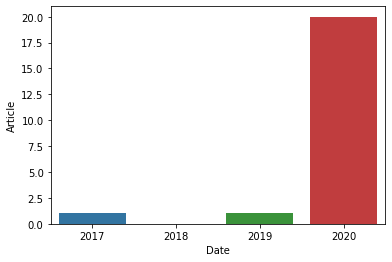

In [ ]:
sns.barplot(yearly.index,yearly.Article)

In [ ]:
from google.colab import files

df.to_csv('Bangkok_Post_PVAC2.csv')
files.download('Bangkok_Post_PVAC2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## PANDAS DATAFRAMES WITH CLEANED DATETIME AS INDICES

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Bangkok_Post_OVAC2.csv?token=AN3DAR33Q4D3UNSR554RWT27OJBAU'
BP_OVAC = pd.read_csv(url)
BP_OVAC.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
1,1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2,2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
3,3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
4,4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...


In [ ]:
BP_OVAC['Class'] = 'OVAC'

In [ ]:
BP_OVAC

,Unnamed: 0,Date,Title,Article_Link,Article,Class
0,0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...,OVAC
1,1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw...",OVAC
2,2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...,OVAC
3,3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...,OVAC
4,4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...,OVAC
...,...,...,...,...,...,...
129,129,2016-01-10 01:51:00,\n\t\t\t\t\t\t\t\t\t\t\tWhen school isn’t safe...,https://www.bangkokpost.com/thailand/special-r...,Bung* is in Mathayom 3 and is counting down th...,OVAC
130,130,2014-09-04 09:45:00,\n\t\t\t\t\t\t\t\t\t\t\tCelebrity photo hacker...,https://www.bangkokpost.com/world/430440/celeb...,LOS ANGELES - Those behind the massive leak of...,OVAC
131,131,2013-03-16 00:00:00,\n\t\t\t\t\t\t\t\t\t\t\tDiscipline our student...,https://www.bangkokpost.com/opinion/opinion/34...,Although corporal punishment was officially ba...,OVAC
132,132,2013-03-14 19:49:00,"\n\t\t\t\t\t\t\t\t\t\t\tTeenagers, sex, alcoho...",https://www.bangkokpost.com/tech/340514/teenag...,A video of high school boys laughing about wat...,OVAC


In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Bangkok_Post_OVAA2.csv?token=AN3DAR4HCV4NDYB4XK7MPKK7OJBKI'
BP_OVAA = pd.read_csv(url)
BP_OVAA.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,NaN,Learn from listening,https://www.bangkokpost.com/learning/learning-...,NaN
1,1,NaN,\n\t\t\t\t\t\t\t\t\t\t\tFacebook too big a pla...,https://www.bangkokpost.com/opinion/opinion/13...,There's something in common between the amazin...
2,2,NaN,\n\t\t\t\t\t\t\t\t\t\t\tThe flipside to 'Nott'...,https://www.bangkokpost.com/opinion/opinion/11...,As social media becomes the bright shining too...
3,3,2015-04-22 01:45:00,\n\t\t\t\t\t\t\t\t\t\t\tTwitter moves to stem ...,https://www.bangkokpost.com/tech/536267/twitte...,WASHINGTON - Twitter on Tuesday began implemen...
4,4,2014-09-18 21:09:00,\n\t\t\t\t\t\t\t\t\t\t\tPhilippines arrests 43...,https://www.bangkokpost.com/world/432970/phili...,MANILA — Philippine authorities say they have ...


In [ ]:
BP_OVAA['Class'] = 'OVAA'

In [ ]:
BP_OVAA

,Unnamed: 0,Date,Title,Article_Link,Article,Class
0,0,NaN,Learn from listening,https://www.bangkokpost.com/learning/learning-...,NaN,OVAA
1,1,NaN,\n\t\t\t\t\t\t\t\t\t\t\tFacebook too big a pla...,https://www.bangkokpost.com/opinion/opinion/13...,There's something in common between the amazin...,OVAA
2,2,NaN,\n\t\t\t\t\t\t\t\t\t\t\tThe flipside to 'Nott'...,https://www.bangkokpost.com/opinion/opinion/11...,As social media becomes the bright shining too...,OVAA
3,3,2015-04-22 01:45:00,\n\t\t\t\t\t\t\t\t\t\t\tTwitter moves to stem ...,https://www.bangkokpost.com/tech/536267/twitte...,WASHINGTON - Twitter on Tuesday began implemen...,OVAA
4,4,2014-09-18 21:09:00,\n\t\t\t\t\t\t\t\t\t\t\tPhilippines arrests 43...,https://www.bangkokpost.com/world/432970/phili...,MANILA — Philippine authorities say they have ...,OVAA
5,5,2011-01-11 14:30:00,\n\t\t\t\t\t\t\t\t\t\t\tPhilippine police arre...,https://www.bangkokpost.com/tech/215528/philip...,Thirty-six people have been arrested in the Ph...,OVAA
6,6,2020-04-29 04:00:00,\n\t\t\t\t\t\t\t\t\t\t\tCops nab online tricks...,https://www.bangkokpost.com/thailand/general/1...,CHIANG MAI: A man who allegedly posed as a wom...,OVAA
7,7,2015-09-21 03:47:00,\n\t\t\t\t\t\t\t\t\t\t\t'Sextortion' a blind s...,https://www.bangkokpost.com/business/700812/se...,The US immigration officer told a young Colomb...,OVAA
8,8,2015-06-20 04:44:00,\n\t\t\t\t\t\t\t\t\t\t\tGoogle acts to curb 'r...,https://www.bangkokpost.com/tech/598136/google...,WASHINGTON - Google said Friday it was taking ...,OVAA
9,9,2014-05-02 10:49:00,\n\t\t\t\t\t\t\t\t\t\t\t58 arrests in global '...,https://www.bangkokpost.com/world/407786/58-ar...,Fifty-eight people have been arrested in the P...,OVAA


In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Bangkok_Post_PVAC2.csv?token=AN3DAR2PHZXORJFLRZ6LKKC7OJBOM'
BP_PVAC = pd.read_csv(url)
BP_PVAC.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,2020-07-27 12:30:00,\n\t\t\t\t\t\t\t\t\t\t\tPandemic of abuse\t\t\...,https://www.bangkokpost.com/business/1958095/p...,Stay-at-home and lockdown measures have helped...
1,1,2020-01-20 04:31:00,An imbalance of power,https://www.bangkokpost.com/life/social-and-li...,"After K-pop singer Lalisa Manoban, better know..."
2,2,2017-02-09 03:12:00,\n\t\t\t\t\t\t\t\t\t\t\t'Vile' UK paedophile r...,https://www.bangkokpost.com/thailand/general/1...,LONDON - A retired English teacher was jailed ...
3,3,2020-07-28 20:45:00,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://www.bangkokpost.com/world/1958875/poli...,BERLIN - Police are searching an allotment plo...
4,4,2020-07-06 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tReenactment of child r...,https://www.bangkokpost.com/thailand/general/1...,A Myanmar man who raped and choked a five-year...


In [ ]:
BP_PVAC['Class'] = 'PVAC'

In [ ]:
BP_PVAC

,Unnamed: 0,Date,Title,Article_Link,Article,Class
0,0,2020-07-27 12:30:00,\n\t\t\t\t\t\t\t\t\t\t\tPandemic of abuse\t\t\...,https://www.bangkokpost.com/business/1958095/p...,Stay-at-home and lockdown measures have helped...,PVAC
1,1,2020-01-20 04:31:00,An imbalance of power,https://www.bangkokpost.com/life/social-and-li...,"After K-pop singer Lalisa Manoban, better know...",PVAC
2,2,2017-02-09 03:12:00,\n\t\t\t\t\t\t\t\t\t\t\t'Vile' UK paedophile r...,https://www.bangkokpost.com/thailand/general/1...,LONDON - A retired English teacher was jailed ...,PVAC
3,3,2020-07-28 20:45:00,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://www.bangkokpost.com/world/1958875/poli...,BERLIN - Police are searching an allotment plo...,PVAC
4,4,2020-07-06 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tReenactment of child r...,https://www.bangkokpost.com/thailand/general/1...,A Myanmar man who raped and choked a five-year...,PVAC
5,5,NaN,Learn from listening,https://www.bangkokpost.com/learning/easy/1941...,NaN,PVAC
6,6,2020-06-16 04:00:00,Fighting a shadow pandemic,https://www.bangkokpost.com/life/social-and-li...,Working from home during the height of Covid-1...,PVAC
7,7,2020-06-11 12:53:00,\n\t\t\t\t\t\t\t\t\t\t\tMan charged with rape ...,https://www.bangkokpost.com/thailand/general/1...,BURI RAM: A 43-year-old man has been arrested ...,PVAC
8,8,2020-06-01 04:30:00,Culture of rape,https://www.bangkokpost.com/life/social-and-li...,A recent rape case in Mukdahan province shocke...,PVAC
9,9,2020-05-26 05:00:00,\n\t\t\t\t\t\t\t\t\t\t\tChecks on teachers for...,https://www.bangkokpost.com/thailand/general/1...,Education Minister Nataphol Teepsuwan on Monda...,PVAC


In [ ]:
BP_Round2 = pd.concat([BP_OVAC, BP_OVAA, BP_PVAC])

In [ ]:
BP_Round2.head()

,Unnamed: 0,Date,Title,Article_Link,Article,Class
0,0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...,OVAC
1,1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw...",OVAC
2,2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...,OVAC
3,3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...,OVAC
4,4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...,OVAC


In [ ]:
df = BP_Round2

In [ ]:
df['Date'] = df['Date'].str.lstrip() # didn't change anything ;) ...

df['Date'] = df['Date'].str.rstrip('\t')

In [ ]:
df['Date'] = df['Date'].str.replace('\t', '')
df['Date'] = df['Date'].str.replace('\n', '')

In [ ]:
df['Date'] = df['Date'].str.replace('published :', '')

In [ ]:
df['Date'] = df['Date'].str.replace('at ', '')

In [ ]:
df['Date']

0     2020-07-13 10:30:00
1     2018-05-07 04:30:00
2     2018-01-08 04:30:00
3     2017-07-23 09:23:00
4     2014-03-29 09:12:00
             ...         
39    2016-04-05 17:15:00
40    2015-06-26 14:04:00
41    2015-01-27 06:00:00
42    2014-05-18 06:04:00
43                    NaN
Name: Date, Length: 214, dtype: object

In [ ]:
#df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

In [ ]:
BP_Round2 = df

In [ ]:
from google.colab import files

BP_Round2.to_csv('BP_Round2.csv')
files.download('BP_Round2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## START MODELING FROM HERE .....

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/BP_Round1.csv?token=AN3DARZFTD74QZQR23VQ4F27NLV3U'
BP_Round2 = pd.read_csv(url)
BP_Round2.head()

,Unnamed: 0,Date,Unnamed: 0.1,Date.1,Title,Article_Link,Article,Class
0,0,2020-07-13 10:30:00,0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...,OVAC
1,1,2018-05-07 04:30:00,1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw...",OVAC
2,2,2018-01-08 04:30:00,2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...,OVAC
3,3,2017-07-23 09:23:00,3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...,OVAC
4,4,2014-03-29 09:12:00,4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...,OVAC


In [ ]:
# increased from 106 > 214 observations
BP_Round2.shape

(214, 6)

In [ ]:
df = BP_Round2

## n-Grams

In [ ]:
# https://towardsdatascience.com/from-dataframe-to-n-grams-e34e29df3460

# nltk also helps in cleaning texts a bit

In [ ]:
import nltk
from nltk import bigrams, trigrams

string = "I really like python, it's pretty awesome."
string_bigrams = bigrams(string)
string_bigrams

<generator object bigrams at 0x7f8a55f7c830>

In [ ]:
# natural language processing: n-gram ranking
import re
import unicodedata
import nltk
from nltk.corpus import stopwords
# add appropriate words that will be ignored in the analysis
ADDITIONAL_STOPWORDS = ['covfefe']

import matplotlib.pyplot as plt

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
def basic_clean(text):
  """
  A simple function to clean up the data. All the words that
  are not designated as a stop word is then lemmatized after
  encoding and basic regex parsing are performed.
  """
  wnl = nltk.stem.WordNetLemmatizer()
  stopwords = nltk.corpus.stopwords.words('english') + ADDITIONAL_STOPWORDS
  text = (unicodedata.normalize('NFKD', text)
    .encode('ascii', 'ignore')
    .decode('utf-8', 'ignore')
    .lower())
  words = re.sub(r'[^\w\s]', '', text).split()
  return [wnl.lemmatize(word) for word in words if word not in stopwords]

In [ ]:
words = basic_clean(''.join(str(BP_Round2['Article'].tolist())))

In [ ]:
words[:20]

['sending',
 'halfnaked',
 'photo',
 'new',
 'facebook',
 'admirer',
 'boy',
 'thought',
 '15',
 'felt',
 'like',
 'flirtatious',
 'move',
 '14yearold',
 'ned',
 'believed',
 'would',
 'show',
 'serious',
 'romantic']

In [ ]:
(pd.Series(nltk.ngrams(words, 2)).value_counts())[:10]

(social, medium)        114
(child, pornography)     89
(sexual, abuse)          80
(last, year)             71
(revenge, porn)          71
(human, trafficking)     68
(law, enforcement)       65
(young, people)          63
(violence, child)        48
(united, state)          47
dtype: int64

In [ ]:
(pd.Series(nltk.ngrams(words, 3)).value_counts())[:10]

(child, sexual, abuse)            27
(pol, maj, gen)                   21
(internet, crime, child)          21
(human, trafficking, charge)      14
(pol, gen, tamasak)               14
(crime, child, ticac)             13
(thailand, internet, crime)       13
(pibool, uppatham, school)        12
(development, human, security)    12
(revenge, porn, website)          12
dtype: int64

In [ ]:
bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:12]

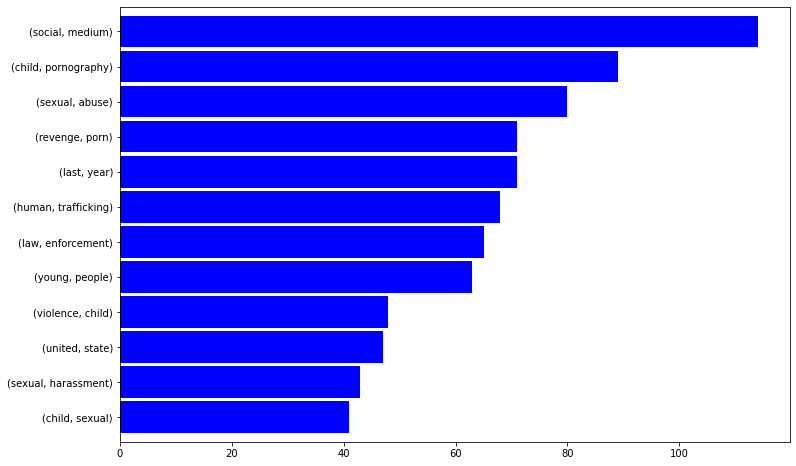

In [ ]:
bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))

In [ ]:
trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:12]

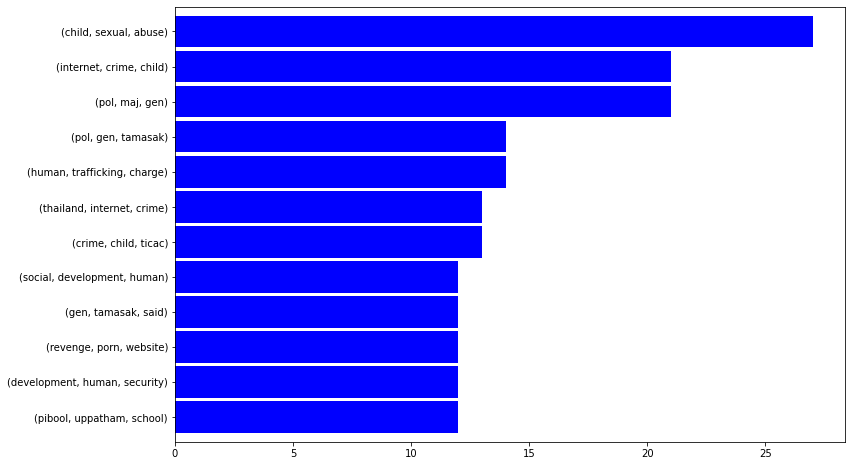

In [ ]:
trigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))

In [ ]:
# let's repeat, but separately for my 3 cats:

In [ ]:
OVAC = BP_Round2[BP_Round2.Class=='OVAC']
PVAC = BP_Round2[BP_Round2.Class=='PVAC']
OVAA = BP_Round2[BP_Round2.Class=='OVAA']

### OVAC n-grams

In [ ]:
words_OVAC = basic_clean(''.join(str(OVAC['Article'].tolist())))

In [ ]:
words_OVAC[:20]

['sending',
 'halfnaked',
 'photo',
 'new',
 'facebook',
 'admirer',
 'boy',
 'thought',
 '15',
 'felt',
 'like',
 'flirtatious',
 'move',
 '14yearold',
 'ned',
 'believed',
 'would',
 'show',
 'serious',
 'romantic']

In [ ]:
words = words_OVAC

In [ ]:
(pd.Series(nltk.ngrams(words, 2)).value_counts())[:10]

(social, medium)        95
(child, pornography)    88
(sexual, abuse)         63
(law, enforcement)      62
(young, people)         57
(last, year)            50
(human, trafficking)    37
(united, state)         35
(child, sexual)         32
(violence, child)       31
dtype: int64

In [ ]:
(pd.Series(nltk.ngrams(words, 3)).value_counts())[:10]

(internet, crime, child)             20
(child, sexual, abuse)               19
(pol, maj, gen)                      14
(pol, gen, tamasak)                  14
(gen, tamasak, said)                 12
(thailand, internet, crime)          12
(pibool, uppatham, school)           12
(crime, child, ticac)                12
(crime, agency, said)                10
(national, bureau, investigation)    10
dtype: int64

In [ ]:
bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:12]

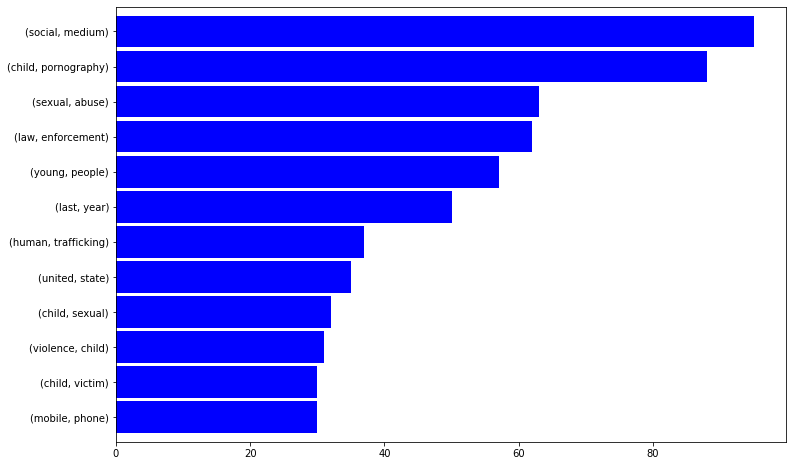

In [ ]:
bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))

In [ ]:
trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:12]

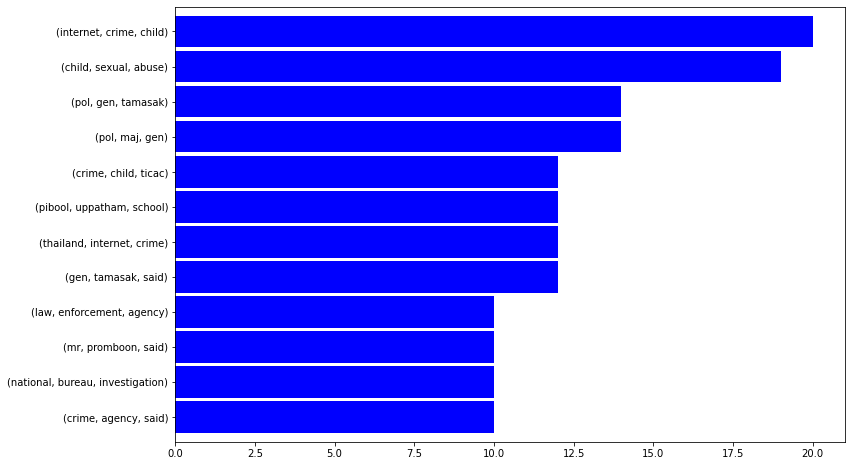

In [ ]:
trigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))

### PVAC n-grams

In [ ]:
words_PVAC = basic_clean(''.join(str(PVAC['Article'].tolist())))

In [ ]:
words_PVAC[:20]

['stayathome',
 'lockdown',
 'measure',
 'helped',
 'contain',
 'greatest',
 'publichealth',
 'threat',
 'world',
 'seen',
 'decade',
 'covid19',
 'receded',
 'many',
 'country',
 'new',
 'publichealth',
 'crisis',
 'emerging',
 'behind']

In [ ]:
words = words_PVAC

In [ ]:
(pd.Series(nltk.ngrams(words, 2)).value_counts())[:10]

(human, trafficking)       31
(sexual, harassment)       29
(human, right)             20
(violence, child)          17
(sexual, abuse)            17
(christian, b)             16
(woman, child)             13
(trafficking, charge)      13
(genderbased, violence)    12
(rape, case)               12
dtype: int64

In [ ]:
(pd.Series(nltk.ngrams(words, 3)).value_counts())[:10]

(human, trafficking, charge)       13
(social, development, human)        8
(child, sexual, abuse)              8
(development, human, security)      8
(sexual, genderbased, violence)     8
(pol, col, kritaya)                 8
(ministry, social, development)     7
(praia, da, luz)                    7
(pol, maj, gen)                     6
(gang, rape, case)                  6
dtype: int64

In [ ]:
bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:12]

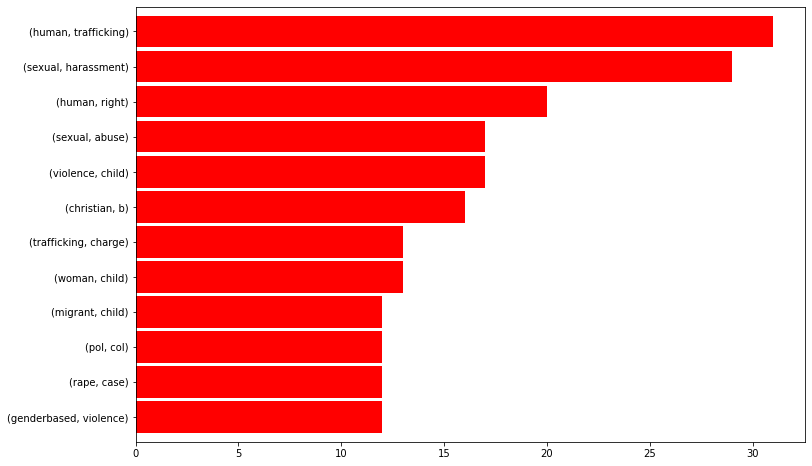

In [ ]:
bigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))

In [ ]:
trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:12]

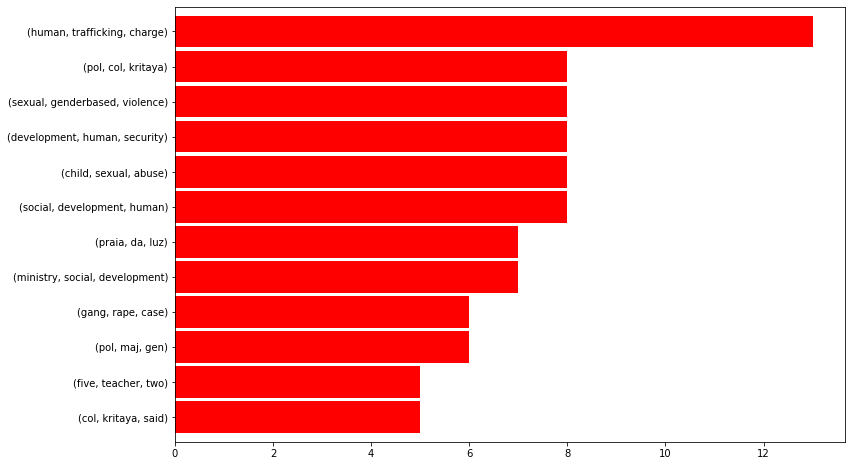

In [ ]:
trigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))

### OVAA n-grams

In [ ]:
words_OVAA = basic_clean(''.join(str(OVAA['Article'].tolist())))

In [ ]:
words_OVAA[:20]

['nan',
 'there',
 'something',
 'common',
 'amazing',
 'story',
 'nicole',
 'mincey',
 'pseudonymous',
 'twitter',
 'user',
 '146000',
 'follower',
 'retweeted',
 'u',
 'president',
 'donald',
 'trump',
 'disappeared',
 'overnight']

In [ ]:
words = words_OVAA

In [ ]:
(pd.Series(nltk.ngrams(words, 2)).value_counts())[:10]

(revenge, porn)         53
(sexually, explicit)    16
(social, medium)        15
(social, network)       12
(bulletin, board)       12
(porn, website)         12
(explicit, image)       11
(search, result)        11
(last, month)           11
(without, consent)      11
dtype: int64

In [ ]:
(pd.Series(nltk.ngrams(words, 3)).value_counts())[:10]

(revenge, porn, website)           12
(sexually, explicit, image)         9
(online, bulletin, board)           8
(sexually, explicit, photo)         6
(revenge, porn, typically)          5
(california, attorney, general)     5
(revenge, porn, victim)             5
(place, open, honest)               4
(would, soon, put)                  4
(attorney, general, kamala)         4
dtype: int64

In [ ]:
bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:12]

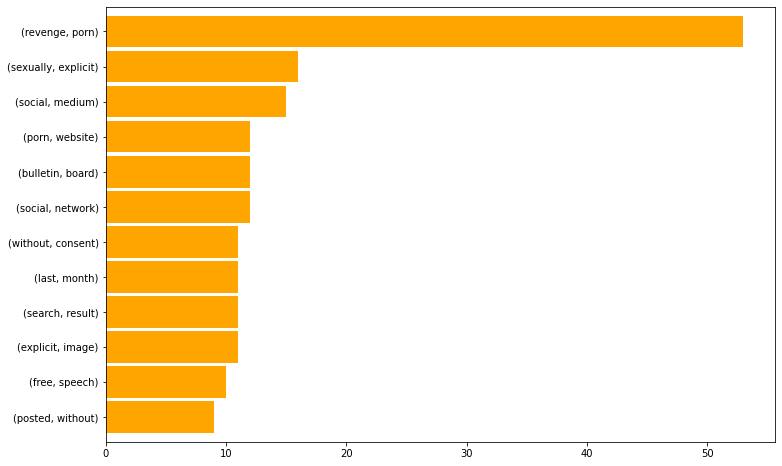

In [ ]:
bigrams_series.sort_values().plot.barh(color='orange', width=.9, figsize=(12, 8))

In [ ]:
trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:12]

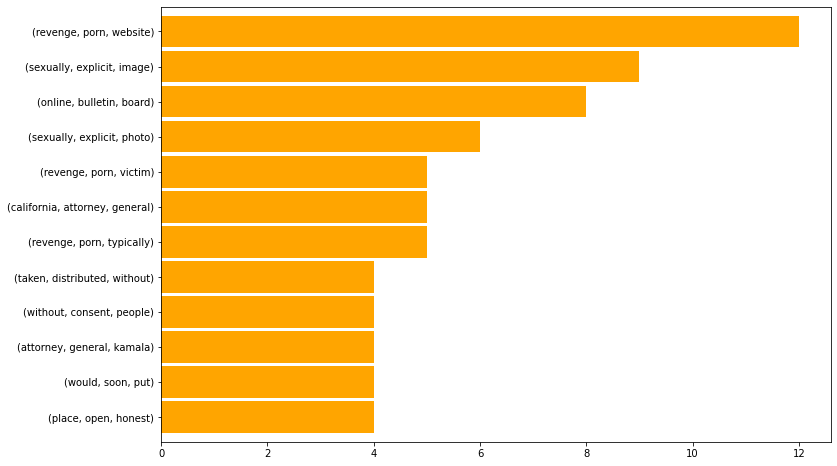

In [ ]:
trigrams_series.sort_values().plot.barh(color='orange', width=.9, figsize=(12, 8))

## DO NOT RUN WHAT FOLLOWS HERE !!!!

In [ ]:
df = df.set_index(df['Date'])

In [ ]:
df.head()

,Date,Unnamed: 0,Date.1,Title,Article_Link,Article,Class
Date,,,,,,,
2020-07-13 10:30:00,2020-07-13 10:30:00,0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...,OVAC
2018-05-07 04:30:00,2018-05-07 04:30:00,1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw...",OVAC
2018-01-08 04:30:00,2018-01-08 04:30:00,2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...,OVAC
2017-07-23 09:23:00,2017-07-23 09:23:00,3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...,OVAC
2014-03-29 09:12:00,2014-03-29 09:12:00,4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...,OVAC


In [ ]:
yearly = df.resample("Y").count()

In [ ]:
yearly

,Date,Unnamed: 0,Date.1,Title,Article_Link,Article,Class
Date,,,,,,,
2011-12-31,3,3,3,3,3,3,3
2012-12-31,2,2,2,2,2,2,2
2013-12-31,4,4,4,4,4,4,4
2014-12-31,19,19,19,19,19,19,19
2015-12-31,11,11,11,11,11,11,11
2016-12-31,3,3,3,3,3,3,3
2017-12-31,5,5,4,5,5,5,5
2018-12-31,7,7,7,7,7,7,7
2019-12-31,11,11,10,11,11,11,11


In [ ]:
yearly.index = yearly.index.year

In [ ]:
yearly

,Date,Unnamed: 0,Date.1,Title,Article_Link,Article,Class
Date,,,,,,,
2011,3,3,3,3,3,3,3
2012,2,2,2,2,2,2,2
2013,4,4,4,4,4,4,4
2014,19,19,19,19,19,19,19
2015,11,11,11,11,11,11,11
2016,3,3,3,3,3,3,3
2017,5,5,4,5,5,5,5
2018,7,7,7,7,7,7,7
2019,11,11,10,11,11,11,11


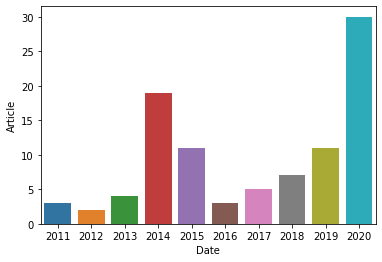

In [ ]:
sns.barplot(yearly.index,yearly.Article)

In [ ]:
df

,Unnamed: 0,Date,Unnamed: 0.1,Date.1,Title,Article_Link,Article,Class
0,0,2020-07-13 10:30:00,0,2020-07-13 10:30:00,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...,OVAC
1,1,2018-05-07 04:30:00,1,2018-05-07 04:30:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw...",OVAC
2,2,2018-01-08 04:30:00,2,2018-01-08 04:30:00,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...,OVAC
3,3,2017-07-23 09:23:00,3,2017-07-23 09:23:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...,OVAC
4,4,2014-03-29 09:12:00,4,2014-03-29 09:12:00,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...,OVAC
...,...,...,...,...,...,...,...,...
101,18,2020-05-12 07:00:00,18,NaN,\n\t\t\t\t\t\t\t\t\t\t\tGang rape charges moun...,https://www.bangkokpost.com/thailand/general/1...,Three teachers from a total of seven suspects ...,PVAC
102,19,2020-02-14 08:46:00,19,NaN,\n\t\t\t\t\t\t\t\t\t\t\tWorld standing by as c...,https://www.bangkokpost.com/world/1857489/worl...,LONDON - Governments were on Thursday urged to...,PVAC
103,20,2020-02-07 13:45:00,20,NaN,\n\t\t\t\t\t\t\t\t\t\t\tMan charged with rapin...,https://www.bangkokpost.com/world/1852734/man-...,NEW DELHI - An Indian man has been charged wit...,PVAC
104,21,2020-01-14 17:39:00,21,NaN,\n\t\t\t\t\t\t\t\t\t\t\tMan accused of raping ...,https://www.bangkokpost.com/thailand/general/1...,SURAT THANI: A 51-year-old man has been arrest...,PVAC


In [ ]:
BP_Round1.columns

Index(['Date', 'Unnamed: 0', 'Date.1', 'Title', 'Article_Link', 'Article',
       'Class'],
      dtype='object')

In [ ]:
df.columns

Index(['Unnamed: 0', 'Date', 'Unnamed: 0.1', 'Date.1', 'Title', 'Article_Link',
       'Article', 'Class'],
      dtype='object')

In [ ]:
# df = df.reset_index()

In [ ]:
df['Article'][0]

0    Sending a half-naked photo of herself to her n...
0                                                  NaN
0    Stay-at-home and lockdown measures have helped...
Name: Article, dtype: object

## CONTINUE RUNNING HERE :)

In [ ]:
import spacy
from spacy import displacy
from spacy.matcher import Matcher
from spacy.matcher import PhraseMatcher

import nltk
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Regular expression library already included in python :)
import re  

In [ ]:
df.isnull().sum()

Unnamed: 0       0
Date            23
Title            0
Article_Link     0
Article          5
Class            0
dtype: int64

In [ ]:
df = df[['Article', 'Class']]

In [ ]:
type(df)

pandas.core.frame.DataFrame

In [ ]:
df.isnull().sum()

Article    5
Class      0
dtype: int64

In [ ]:
df.dropna(inplace=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df.shape    # increased from 104 to 209 observations

(209, 2)

In [ ]:
type(df)

pandas.core.frame.DataFrame

In [ ]:
df.columns

Index(['Article', 'Class'], dtype='object')

In [ ]:
df2_4_model = df

In [ ]:
from google.colab import files

df2_4_model.to_csv('df2_4_model.csv')
files.download('df2_4_model.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## ACTUAL TERTIARY CLASSIFIER MODEL

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/df2_4_model.csv?token=AN3DAR7ULCVRXKTJLGOAZS27OTRLQ'
SVM_classifier_data = pd.read_csv(url)
SVM_classifier_data.head()

,Unnamed: 0,Article,Class
0,0,Sending a half-naked photo of herself to her n...,OVAC
1,1,"Shutting children away behind closed doors, aw...",OVAC
2,2,Enticed by the pretty face who sent him a Face...,OVAC
3,3,A schoolboy came to the police with a broken h...,OVAC
4,4,VANCOUVER - A former Canadian schoolteacher wh...,OVAC


In [ ]:
SVM_classifier_data.shape

(209, 3)

In [ ]:
X = SVM_classifier_data['Article']                 #.drop(BP_Round1['Class'].index())
y = SVM_classifier_data['Class']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.33, random_state=42)

In [ ]:
from sklearn.pipeline import Pipeline

from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.feature_extraction.text import CountVectorizer

from sklearn.svm import LinearSVC

# count_vect = CountVectorizer

In [ ]:
text_clf = Pipeline([('tfidf', TfidfVectorizer()),
                     ('clf', LinearSVC())])

In [ ]:
text_clf.fit(X_train,y_train)

Pipeline(memory=None,
         steps=[('tfidf',
                 TfidfVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.float64'>,
                                 encoding='utf-8', input='content',
                                 lowercase=True, max_df=1.0, max_features=None,
                                 min_df=1, ngram_range=(1, 1), norm='l2',
                                 preprocessor=None, smooth_idf=True,
                                 stop_words=None, strip_accents=None,
                                 sublinear_tf=False,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, use_idf=True,
                                 vocabulary=None)),
                ('clf',
                 LinearSVC(C=1.0, class_weight=None, dual=True,
                           fit_intercept=True, intercept_scaling=1,
               

In [ ]:
predictions = text_clf.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [ ]:
print(confusion_matrix(y_test, predictions))

[[ 5  8  0]
 [ 0 41  0]
 [ 0  9  6]]


In [ ]:
# precision decreased from 74->71%, recall 95->100% :))))

print(classification_report(y_test, predictions))                    

              precision    recall  f1-score   support

        OVAA       1.00      0.38      0.56        13
        OVAC       0.71      1.00      0.83        41
        PVAC       1.00      0.40      0.57        15

    accuracy                           0.75        69
   macro avg       0.90      0.59      0.65        69
weighted avg       0.83      0.75      0.72        69



In [ ]:
nlp = spacy.load('en_core_web_sm')

In [ ]:
doc = nlp(all_texts)

In [ ]:
for token in doc[0:1000]:
  print(token.text,token.pos_)

Sending VERB
a DET
half ADV
- PUNCT
naked ADJ
photo NOUN
of ADP
herself PRON
to ADP
her DET
new ADJ
Facebook PROPN
admirer NOUN
, PUNCT
a DET
boy NOUN
she PRON
thought VERB
was AUX
15 NUM
, PUNCT
felt VERB
like SCONJ
a DET
flirtatious ADJ
move NOUN
that SCONJ
14-year NUM
- PUNCT
old ADJ
Ned PROPN
* PUNCT
believed VERB
would VERB
show VERB
she PRON
was AUX
serious ADJ
about ADP
having VERB
a DET
romantic ADJ
relationship NOUN
with ADP
the DET
handsome ADJ
teen NOUN
whose DET
photoshopped VERB
profile NOUN
photo NOUN
made VERB
him PRON
out ADP
to PART
be AUX
a DET
stud NOUN
. PUNCT
Little ADV
did AUX
she PRON
realise VERB
that SCONJ
pressing VERB
the DET
send NOUN
button NOUN
would VERB
lead VERB
to ADP
serious ADJ
consequences NOUN
because SCONJ
the DET
young ADJ
man NOUN
who PRON
she PRON
believed VERB
she PRON
had AUX
fallen VERB
in ADP
love NOUN
with ADP
was AUX
an DET
online ADJ
child NOUN
predator NOUN
looking VERB
to PART
con VERB
young ADJ
women NOUN
into ADP
sending VERB
intimat

In [ ]:
for token in doc[0:100]:
  print(token.text,end=' ¦ ')

Sending ¦ a ¦ half ¦ - ¦ naked ¦ photo ¦ of ¦ herself ¦ to ¦ her ¦ new ¦ Facebook ¦ admirer ¦ , ¦ a ¦ boy ¦ she ¦ thought ¦ was ¦ 15 ¦ , ¦ felt ¦ like ¦ a ¦ flirtatious ¦ move ¦ that ¦ 14-year ¦ - ¦ old ¦ Ned ¦ * ¦ believed ¦ would ¦ show ¦ she ¦ was ¦ serious ¦ about ¦ having ¦ a ¦ romantic ¦ relationship ¦ with ¦ the ¦ handsome ¦ teen ¦ whose ¦ photoshopped ¦ profile ¦ photo ¦ made ¦ him ¦ out ¦ to ¦ be ¦ a ¦ stud ¦ . ¦ Little ¦ did ¦ she ¦ realise ¦ that ¦ pressing ¦ the ¦ send ¦ button ¦ would ¦ lead ¦ to ¦ serious ¦ consequences ¦ because ¦ the ¦ young ¦ man ¦ who ¦ she ¦ believed ¦ she ¦ had ¦ fallen ¦ in ¦ love ¦ with ¦ was ¦ an ¦ online ¦ child ¦ predator ¦ looking ¦ to ¦ con ¦ young ¦ women ¦ into ¦ sending ¦ intimate ¦ photos ¦ 

In [ ]:
for entity in doc[0:100].ents:
  print(entity)
  print(entity.label_)
  print(str(spacy.explain(entity.label_)))
  print('\n')

NameError: ignored

In [ ]:
for chunk in doc[0:1000].noun_chunks:
  print(chunk)

a half-naked photo
herself
her new Facebook admirer
a boy
she
a flirtatious move
she
a romantic relationship
the handsome teen
whose photoshopped profile photo
him
a stud
she
the send button
serious consequences
the young man
who
she
she
love
an online child predator
young women
intimate photos
the guise
a blossoming romance
her suggestive photo
a private Line group
paedophiles
anybody
lewd photos
young girls
The incident
her
a state
depression
the stress
her school lessons
remote learning
the height
She
a sense
dread
the thought
such private photos
The thought
the photos
the internet
she
her misery
predicament
she
the consequences
her actions
Ned's encounter
online child predators
the Covid-19 pandemic
numerous other youngsters
the last three months
a recent report
the Thailand Internet Crimes
Children Taskforce
(TICAC
a nationwide cyber sting operation
online predators
support
local and international law enforcement agencies
NGOs
What
the investigation
the global pandemic
perpetrator

In [ ]:
for sentence in doc[0:100].sents:
  print(sentence)

AttributeError: ignored

# TOKENIZATION

In [ ]:
from spacy import displacy

In [ ]:
doc

Sending a half-naked photo of herself to her new Facebook admirer, a boy she thought was 15, felt like a flirtatious move that 14-year-old Ned* believed would show she was serious about having a romantic relationship with the handsome teen whose photoshopped profile photo made him out to be a stud. Little did she realise that pressing the send button would lead to serious consequences because the young man who she believed she had fallen in love with was an online child predator looking to con young women into sending intimate photos in the guise of a blossoming romance. The next day, her suggestive photo was shared in a private Line group for paedophiles and just about anybody else interested in looking at lewd photos of young girls. The incident drove her into a state of depression, which was further exacerbated by the stress of having to keep up with her school lessons via remote learning at the height of Covid-19. She was overwhelmed with a sense of dread and the thought that such 

In [ ]:
displacy.render(doc[0:200], style='dep') # ????

'<svg xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink" xml:lang="en" id="1655a3795df342a5994c5fc62fed23f4-0" class="displacy" width="32950" height="1362.0" direction="ltr" style="max-width: none; height: 1362.0px; color: #000000; background: #ffffff; font-family: Arial; direction: ltr">\n<text class="displacy-token" fill="currentColor" text-anchor="middle" y="1272.0">\n    <tspan class="displacy-word" fill="currentColor" x="50">Sending</tspan>\n    <tspan class="displacy-tag" dy="2em" fill="currentColor" x="50">VERB</tspan>\n</text>\n\n<text class="displacy-token" fill="currentColor" text-anchor="middle" y="1272.0">\n    <tspan class="displacy-word" fill="currentColor" x="225">a</tspan>\n    <tspan class="displacy-tag" dy="2em" fill="currentColor" x="225">DET</tspan>\n</text>\n\n<text class="displacy-token" fill="currentColor" text-anchor="middle" y="1272.0">\n    <tspan class="displacy-word" fill="currentColor" x="400">half-</tspan>\n    <tspan class="disp

In [ ]:
displacy.render(doc[0:200], style='ent') # ????

'<div class="entities" style="line-height: 2.5; direction: ltr">Sending a \n<mark class="entity" style="background: #e4e7d2; padding: 0.45em 0.6em; margin: 0 0.25em; line-height: 1; border-radius: 0.35em;">\n    half\n    <span style="font-size: 0.8em; font-weight: bold; line-height: 1; border-radius: 0.35em; text-transform: uppercase; vertical-align: middle; margin-left: 0.5rem">CARDINAL</span>\n</mark>\n-naked photo of herself to her new \n<mark class="entity" style="background: #7aecec; padding: 0.45em 0.6em; margin: 0 0.25em; line-height: 1; border-radius: 0.35em;">\n    Facebook\n    <span style="font-size: 0.8em; font-weight: bold; line-height: 1; border-radius: 0.35em; text-transform: uppercase; vertical-align: middle; margin-left: 0.5rem">ORG</span>\n</mark>\n admirer, a boy she thought was \n<mark class="entity" style="background: #bfe1d9; padding: 0.45em 0.6em; margin: 0 0.25em; line-height: 1; border-radius: 0.35em;">\n    15\n    <span style="font-size: 0.8em; font-weight: 

In [ ]:
for token in doc[0:100]:
  print(token.text + ' -----> ' + SnowballStemmer.stem(token))

TypeError: ignored

In [ ]:
for token in doc[0:100]:
  print(token.text, '\t', token.pos_, '\t',token.lemma, '\t', token.lemma_ )

Sending 	 VERB 	 6965176418496841198 	 send
a 	 DET 	 11901859001352538922 	 a
half 	 ADV 	 11367834210198928698 	 half
- 	 PUNCT 	 9153284864653046197 	 -
naked 	 ADJ 	 14769316496626258017 	 naked
photo 	 NOUN 	 12453600060201764970 	 photo
of 	 ADP 	 886050111519832510 	 of
herself 	 PRON 	 561228191312463089 	 -PRON-
to 	 ADP 	 3791531372978436496 	 to
her 	 DET 	 561228191312463089 	 -PRON-
new 	 ADJ 	 4753564829687343602 	 new
Facebook 	 PROPN 	 8081970590932371665 	 Facebook
admirer 	 NOUN 	 16409556654033561227 	 admirer
, 	 PUNCT 	 2593208677638477497 	 ,
a 	 DET 	 11901859001352538922 	 a
boy 	 NOUN 	 6943052338024606995 	 boy
she 	 PRON 	 561228191312463089 	 -PRON-
thought 	 VERB 	 16875814820671380748 	 think
was 	 AUX 	 10382539506755952630 	 be
15 	 NUM 	 13771760024209633521 	 15
, 	 PUNCT 	 2593208677638477497 	 ,
felt 	 VERB 	 5741770584995928333 	 feel
like 	 SCONJ 	 18194338103975822726 	 like
a 	 DET 	 11901859001352538922 	 a
flirtatious 	 ADJ 	 515837462892622611

In [ ]:
#remove stopwords

In [ ]:
exp = all_texts.lower().split()

In [ ]:
exp

['sending',
 'a',
 'half-naked',
 'photo',
 'of',
 'herself',
 'to',
 'her',
 'new',
 'facebook',
 'admirer,',
 'a',
 'boy',
 'she',
 'thought',
 'was',
 '15,',
 'felt',
 'like',
 'a',
 'flirtatious',
 'move',
 'that',
 '14-year-old',
 'ned*',
 'believed',
 'would',
 'show',
 'she',
 'was',
 'serious',
 'about',
 'having',
 'a',
 'romantic',
 'relationship',
 'with',
 'the',
 'handsome',
 'teen',
 'whose',
 'photoshopped',
 'profile',
 'photo',
 'made',
 'him',
 'out',
 'to',
 'be',
 'a',
 'stud.',
 'little',
 'did',
 'she',
 'realise',
 'that',
 'pressing',
 'the',
 'send',
 'button',
 'would',
 'lead',
 'to',
 'serious',
 'consequences',
 'because',
 'the',
 'young',
 'man',
 'who',
 'she',
 'believed',
 'she',
 'had',
 'fallen',
 'in',
 'love',
 'with',
 'was',
 'an',
 'online',
 'child',
 'predator',
 'looking',
 'to',
 'con',
 'young',
 'women',
 'into',
 'sending',
 'intimate',
 'photos',
 'in',
 'the',
 'guise',
 'of',
 'a',
 'blossoming',
 'romance.',
 'the',
 'next',
 'day,',


In [ ]:
len(all_texts)

426332

In [ ]:
len(exp)

69083

In [ ]:
'''
from nltk import FreqDist

train_set = all_texts
word_dist = FreqDist()

for s in train_set:
    word_dist.update(s.split())

print(dict(word_dist))
'''

'\nfrom nltk import FreqDist\n\ntrain_set = all_texts\nword_dist = FreqDist()\n\nfor s in train_set:\n    word_dist.update(s.split())\n\nprint(dict(word_dist))\n'

In [ ]:
vocab = {}
i = 1

# with open('1.txt') as f:
#     x = f.read().lower().split()

for word in exp:
    if word in vocab:
        continue
    else:
        vocab[word]=i
        i+=1

print(vocab)

{'sending': 1, 'a': 2, 'half-naked': 3, 'photo': 4, 'of': 5, 'herself': 6, 'to': 7, 'her': 8, 'new': 9, 'facebook': 10, 'admirer,': 11, 'boy': 12, 'she': 13, 'thought': 14, 'was': 15, '15,': 16, 'felt': 17, 'like': 18, 'flirtatious': 19, 'move': 20, 'that': 21, '14-year-old': 22, 'ned*': 23, 'believed': 24, 'would': 25, 'show': 26, 'serious': 27, 'about': 28, 'having': 29, 'romantic': 30, 'relationship': 31, 'with': 32, 'the': 33, 'handsome': 34, 'teen': 35, 'whose': 36, 'photoshopped': 37, 'profile': 38, 'made': 39, 'him': 40, 'out': 41, 'be': 42, 'stud.': 43, 'little': 44, 'did': 45, 'realise': 46, 'pressing': 47, 'send': 48, 'button': 49, 'lead': 50, 'consequences': 51, 'because': 52, 'young': 53, 'man': 54, 'who': 55, 'had': 56, 'fallen': 57, 'in': 58, 'love': 59, 'an': 60, 'online': 61, 'child': 62, 'predator': 63, 'looking': 64, 'con': 65, 'women': 66, 'into': 67, 'intimate': 68, 'photos': 69, 'guise': 70, 'blossoming': 71, 'romance.': 72, 'next': 73, 'day,': 74, 'suggestive': 75

In [ ]:
len(vocab)

10972

In [ ]:
X

,Article
0,Sending a half-naked photo of herself to her n...
1,"Shutting children away behind closed doors, aw..."
2,Enticed by the pretty face who sent him a Face...
3,A schoolboy came to the police with a broken h...
4,VANCOUVER - A former Canadian schoolteacher wh...
...,...
18,Three teachers from a total of seven suspects ...
19,LONDON - Governments were on Thursday urged to...
20,NEW DELHI - An Indian man has been charged wit...
21,SURAT THANI: A 51-year-old man has been arrest...


In [ ]:
X.isnull().sum()

Article    2
dtype: int64

In [ ]:
X['Article'][0]

0    Sending a half-naked photo of herself to her n...
0                                                  NaN
0    Stay-at-home and lockdown measures have helped...
Name: Article, dtype: object

In [ ]:
print(X['Article'][0])

0    Sending a half-naked photo of herself to her n...
0                                                  NaN
0    Stay-at-home and lockdown measures have helped...
Name: Article, dtype: object


In [ ]:
# Create an empty vector with space for each word in the vocabulary:
one = [X['Article'][0]]+[0]*len(vocab)
one

[0    Sending a half-naked photo of herself to her n...
 0                                                  NaN
 0    Stay-at-home and lockdown measures have helped...
 Name: Article, dtype: object,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 

In [ ]:
len(one)

10973

In [ ]:
X.Article[0].split()

AttributeError: ignored

In [ ]:
for i in X.Article[i]:
  one[vocab[word]]+=1

# all_texts = X.Article.str.cat()
# exp = all_texts.lower().split()

KeyError: ignored

In [ ]:
# map the frequencies of each word in 1.txt to our vector:
with open('1.txt') as f:
    x = f.read().lower().split()
    
for word in x:
    one[vocab[word]]+=1
    
one

In [ ]:
one

In [ ]:
y

0     OVAC
1     OVAC
2     OVAC
3     OVAC
4     OVAC
      ... 
18    PVAC
19    PVAC
20    PVAC
21    PVAC
22    PVAC
Name: Class, Length: 106, dtype: object

In [ ]:
y.value_counts(dropna=False)

OVAC    64
PVAC    23
OVAA    19
Name: Class, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.33, random_state=42)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
count_vect = CountVectorizer

In [ ]:
count_vect.get_feature_names()

TypeError: ignored

In [ ]:
X_train

,Article
28,So you think you’re safe behind your phone scr...
40,AIS introduces DQ to educate children on digit...
5,"Total Access Communication (DTAC), the country..."
21,SURAT THANI: A 51-year-old man has been arrest...
12,SEOUL: K-pop star Jung Joon-young has been arr...
...,...
7,The US immigration officer told a young Colomb...
14,AIS introduces DQ to educate children on digit...
9,Education Minister Nataphol Teepsuwan on Monda...
51,MANILA - The Philippines has rescued two child...


In [ ]:
y_train.value_counts(dropna=False)

OVAC    43
PVAC    18
OVAA    10
Name: Class, dtype: int64

In [ ]:
# count_vect.fit(X_train)
# X_train_counts = count_vect.transform(X_train)

X_train_counts = count_vect.fit_transform(X_train)

TypeError: ignored

In [ ]:
X_train_counts.shape

NameError: ignored

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/smsspamcollection.tsv?token=AN3DAR2E5ET6C4FHEA7N2BS7NI5ZC'
SMS_classification = pd.read_csv(url, sep='\t')
SMS_classification.head()

,label,message,length,punct
0,ham,"Go until jurong point, crazy.. Available only ...",111,9
1,ham,Ok lar... Joking wif u oni...,29,6
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,155,6
3,ham,U dun say so early hor... U c already then say...,49,6
4,ham,"Nah I don't think he goes to usf, he lives aro...",61,2


In [ ]:
type(SMS_classification)

pandas.core.frame.DataFrame

Build a Vocabulary

In [ ]:
vocab = {}
i = 1

with open('1.txt') as f:
    x = f.read().lower().split()

for word in x:
    if word in vocab:
        continue
    else:
        vocab[word]=i
        i+=1

print(vocab)

In [ ]:
SMS_classification[0]#['message']

KeyError: ignored

## Reading in Rubens' NBC-USA tagged

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Tagged%20NBC-USA.csv?token=AN3DARZYQPBGJN7V4WFFPMS7NLVL4'
US_NBC = pd.read_csv(url)
US_NBC.head()

,Online,Offline,Date,Title,Article_Link,Article
0,1.0,1.0,"Sept. 18, 2018",Former Oklahoma state senator sentenced to 15 ...,https://www.nbcnews.com/news/us-news/former-ok...,OKLAHOMA CITY — A former Republican state sena...
1,0.0,1.0,"June 19, 2019,",NXIVM sex cult leader Keith Raniere guilty of ...,https://www.nbcnews.com/news/us-news/sex-cult-...,A federal jury took just hours to convict a Ne...
2,0.0,1.0,"July 8, 2019,",Jeffrey Epstein charged with sex trafficking v...,https://www.nbcnews.com/news/us-news/jeffrey-e...,"A ""vast trove of lewd photographs"" of young-lo..."
3,0.0,0.0,"April 22, 2020",Child sex trafficking survivor supported by Ki...,https://www.nbcnews.com/news/us-news/child-sex...,A child sex trafficking survivor whose case wa...
4,0.0,1.0,"July 7, 2019,",Billionaire sex offender Jeffrey Epstein arres...,https://www.nbcnews.com/news/us-news/billionai...,Billionaire convicted sex offender Jeffrey Eps...


In [ ]:
len(US_NBC)

51

In [ ]:
for_comp = US_NBC[['Online', 'Offline', 'Article']]

In [ ]:
from google.colab import files

for_comp.to_csv('for_comp.csv')
files.download('for_comp.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
X_test_RC = US_NBC.Article

In [ ]:
X_test_RC

0     OKLAHOMA CITY — A former Republican state sena...
1     A federal jury took just hours to convict a Ne...
2     A "vast trove of lewd photographs" of young-lo...
3     A child sex trafficking survivor whose case wa...
4     Billionaire convicted sex offender Jeffrey Eps...
5     The U.S. Catholic Church spent $10.6 million o...
6     A sting operation by Florida police has led to...
7     ALBUQUERQUE, N.M. — A leader of a New Mexico m...
8     The long and bitter battle for legislation tha...
9     In response to questions from NBC News about w...
10    A doctor who treated America's Olympic gymnast...
11    A Kentucky man whose state prison sentence for...
12    On a cool evening in October, Alain Malcolm, 2...
13    A Pennsylvania police chief arrested in a chil...
14    BELLEFONTE, Pa. — A son of former Penn State U...
15    A Michigan doctor accused of sexually abusing ...
16    The adopted daughter of actress Mia Farrow and...
17    "Do I feel that they have a practice of pr

In [ ]:
X_test_RC[48]

'Jennifer Araoz says she was 14 years old when a young woman approached her outside her New York City high school in the fall of 2001. The woman was friendly and curious, asking Araoz personal questions about her family, her upbringing, their finances. Soon she began talking to Araoz about a man she knew who was kind and wealthy and lived nearby. His name, the woman said, was Jeffrey Epstein. The first few times she went to Epstein\'s Manhattan townhouse, all they did was talk, Araoz said, and the friendly woman came along. Araoz told him about her dream of becoming a Broadway actress and about her father, who had died of AIDS when she was 12. But on Araoz\'s first visit without the woman, Epstein gave her a tour of his mansion that culminated in a visit to what he described as his "favorite room in the house," Araoz said. A massage table sat on the floor. A painting of a nude young woman hung from the wall. Araoz would return to that room regularly over the next year, she said, manipu

In [ ]:
X_test_RC.drop([23], inplace=True)

In [ ]:
X_test_RC['predictions'] = text_clf.predict(X_test_RC)

In [ ]:
X_test_RC.predictions

array(['OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC',
       'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'PVAC', 'OVAC',
       'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC',
       'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC',
       'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC', 'OVAC',
       'OVAC', 'OVAC', 'OVAC', 'OVAC', 'PVAC', 'OVAC', 'OVAC', 'PVAC',
       'PVAC', 'OVAC'], dtype=object)

In [ ]:
X_test_RC.shape

(51,)

In [ ]:
X_test_RC.head()

0    OKLAHOMA CITY — A former Republican state sena...
1    A federal jury took just hours to convict a Ne...
2    A "vast trove of lewd photographs" of young-lo...
3    A child sex trafficking survivor whose case wa...
4    Billionaire convicted sex offender Jeffrey Eps...
Name: Article, dtype: object

In [ ]:
US_NBC.shape

(51, 6)

In [ ]:
US_NBC

,Online,Offline,Date,Title,Article_Link,Article
0,1.0,1.0,"Sept. 18, 2018",Former Oklahoma state senator sentenced to 15 ...,https://www.nbcnews.com/news/us-news/former-ok...,OKLAHOMA CITY — A former Republican state sena...
1,0.0,1.0,"June 19, 2019,",NXIVM sex cult leader Keith Raniere guilty of ...,https://www.nbcnews.com/news/us-news/sex-cult-...,A federal jury took just hours to convict a Ne...
2,0.0,1.0,"July 8, 2019,",Jeffrey Epstein charged with sex trafficking v...,https://www.nbcnews.com/news/us-news/jeffrey-e...,"A ""vast trove of lewd photographs"" of young-lo..."
3,0.0,0.0,"April 22, 2020",Child sex trafficking survivor supported by Ki...,https://www.nbcnews.com/news/us-news/child-sex...,A child sex trafficking survivor whose case wa...
4,0.0,1.0,"July 7, 2019,",Billionaire sex offender Jeffrey Epstein arres...,https://www.nbcnews.com/news/us-news/billionai...,Billionaire convicted sex offender Jeffrey Eps...
5,0.0,0.0,"June 4, 2019,",Catholic Church spent $10 million on lobbyists...,https://www.nbcnews.com/news/us-news/catholic-...,The U.S. Catholic Church spent $10.6 million o...
6,1.0,1.0,"Feb. 13, 2014,",Disney World Workers Among 22 Nabbed in Child-...,https://www.nbcnews.com/news/us-news/disney-wo...,A sting operation by Florida police has led to...
7,0.0,1.0,"Aug. 22, 2017,",Military-Style Christian Sect Leader Charged i...,https://www.nbcnews.com/news/us-news/military-...,"ALBUQUERQUE, N.M. — A leader of a New Mexico m..."
8,0.0,0.0,"Jan. 28, 2019,",N.Y. Senate votes to give victims of child sex...,https://www.nbcnews.com/news/us-news/new-york-...,The long and bitter battle for legislation tha...
9,0.0,1.0,"Oct. 7, 2018,",Jehovah's Witnesses 'use the Bible to victim-s...,https://www.nbcnews.com/news/us-news/jehovah-s...,In response to questions from NBC News about w...


In [ ]:
predictions.unique()

AttributeError: ignored

In [ ]:
pred_RC_US_NBC = pd.DataFrame(predictions)

In [ ]:
pred_RC_US_NBC

,0
0,OVAC
1,OVAC
2,OVAC
3,OVAC
4,OVAC
5,OVAC
6,OVAC
7,OVAC
8,OVAC
9,OVAC


In [ ]:
from google.colab import files

pred_RC_US_NBC.to_csv('pred_RC_US_NBC.csv')
files.download('pred_RC_US_NBC.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
pred_RC_US_NBC['0'].value_counts(dropna=False)

KeyError: ignored

## COMPARISON Rubens-manual vs Prediction by Diana's Tertiary Classifier

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/US_NBC_Validation.csv?token=AN3DAR27JE2V7OLWF26C2NS7NL4Y6'
US_NBC_comp = pd.read_csv(url, sep=',')
US_NBC_comp.head()

ParserError: ignored

## Finland_Yle (Rubens)

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Finland-Yle.csv?token=AN3DAR2YZ2QBAFSKEUWJ5L27OTRB4'
FinlandYle = pd.read_csv(url, sep=',')
FinlandYle.head()

,Date,Title,Article_Link,Article
0,9.1.2020,Appeal court upholds guilty verdict in Oulu ch...,https://yle.fi/uutiset/11150396,The Rovaniemi Court of Appeal has upheld the c...
1,15.5.2019,Mikkeli man convicted in child sexual abuse case,https://yle.fi/uutiset/10783816,The defendant in the case was convicted and se...
2,7.6.2019,Court hands down 40-month prison sentence in 4...,https://yle.fi/uutiset/10820884,The Oulu district court has convicted a 29-yea...
3,3.1.2019,Southern Finland coach in custody on suspicion...,https://yle.fi/uutiset/10579990,"The coach of a sports club in Hyvinkää, southe..."
4,20.9.2019,Ex-church councillor among four charged in vio...,https://yle.fi/uutiset/10981177,"Authorities in Ostrobothnia, western Finland h..."


In [ ]:
FinlandYle.shape

(158, 4)

In [ ]:
FinlandYle['predictions'] = text_clf.predict(FinlandYle.Article)

In [ ]:
FinlandYle['predictions'].value_counts(dropna=False)

OVAC    146
PVAC     12
Name: predictions, dtype: int64

In [ ]:
Finland_PVAC = FinlandYle.loc[FinlandYle.predictions == 'PVAC']

In [ ]:
Finland_PVAC.shape

(12, 5)

In [ ]:
Finland_PVAC

,Date,Title,Article_Link,Article,predictions
0,9.1.2020,Appeal court upholds guilty verdict in Oulu ch...,https://yle.fi/uutiset/11150396,The Rovaniemi Court of Appeal has upheld the c...,PVAC
2,7.6.2019,Court hands down 40-month prison sentence in 4...,https://yle.fi/uutiset/10820884,The Oulu district court has convicted a 29-yea...,PVAC
6,8.1.2020,Helsinki teacher appeals suspended sentence fo...,https://yle.fi/uutiset/11147629,A male teacher at a Helsinki school has appeal...,PVAC
7,24.1.2019,Pori man gets 16 months jail time for child se...,https://yle.fi/uutiset/10612058,The Satakunta district court has sentenced a P...,PVAC
10,12.2.2019,Two new suspected cases of child sexual abuse ...,https://yle.fi/uutiset/10642570,Police in Oulu said on Monday that they are in...,PVAC
15,9.7.2019,Four and a half year prison sentence in 6th Ou...,https://yle.fi/uutiset/10869460,The Oulu District Court sentenced Hassan Moham...,PVAC
50,3.5.2018,Supreme Court denies appeal in sexual abuse of...,https://yle.fi/uutiset/10188676,The Supreme Court has rejected the prosecution...,PVAC
54,28 4 2020,Police investigate Helsinki child abuse case,https://yle.fi/uutiset/11326815,Police in Helsinki are investigating the suspe...,PVAC
65,16.1.2019,"Sex crime probes advance in Helsinki, Oulu",https://yle.fi/uutiset/10599388,A man who police suspect carried out a number ...,PVAC
96,19.10.2012,Kidnapping suspect in possession of child porn...,http://yle.fi/uutiset/6342318,"On September 25th, an 8-year-old girl was abdu...",PVAC


In [ ]:
from google.colab import files

Finland_PVAC.to_csv('Finland_PVAC.csv')
files.download('Finland_PVAC.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
Finland_PVAC.Article[0]

"The Rovaniemi Court of Appeal has upheld the conviction by Oulu District Court of a 30-year-old man for the sexual abuse of a 13-year-old girl. The court sentenced the defendant, Javad Mirzad, to three years and four months in prison after he was found guilty of aggravated child sexual abuse by the district court last summer.  The appeal court confirmed the man's guilty verdict on the charges brought against him. However, the court halved the amount of damages the defendant was ordered to pay the victim - down a total of 1,500 euros. The appeal hearing was linked to a series of similar cases in which a 13-year-old girl was believed to have suffered abuse at the hands of eight foreign-background men between June and October of 2018. The court found that the offences involving the defendant occurred at a private residence in the Oulu region August 2018 and that the victim and the defendant had been in contact via a messaging service. All of the defendants involved had arrived in the cou

In [ ]:
Finland_PVAC.Article[96]

"On September 25th, an 8-year-old girl was abducted into a van in the Tavastila area of Kotka. A few hours later, the girl was found physically unharmed about 15 kilometres from her home. The self-confessed suspect has told police that he chose his victim at random without any plan in mind. He bound the girl, took her to a cottage in the Perno area of Kotka and left her there, still bound, while he returned to work. During the day he saw from the media that police were making progress in their search for the child and a van described by witnesses. Despite having her arms taped, the girl was able to use her cell phone to call her mother and the emergency services centre. After finishing work, the suspect was returning home when he saw police nearby and attempted to flee, but apprehended. In addition to questioning the suspect about the abduction, police are also investigating possible charges of attempted child sexual abuse and possession of obscene images of minors. Police seized the m

## Pakistan (Usama)

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Pakistan.csv?token=AN3DAR3AVZDPCAXSIPW2OXK7OTT4M'
Pakistan_MU = pd.read_csv(url, sep=',')
Pakistan_MU.head()

,Unnamed: 0,Date,Media,authors,Title,Article,Summary,keywords,link
0,0,"Jun 5, 2020",Reuters,"Zofeen T. Ebrahim, Min Read,",Eight-year-old maid's death spurs calls for ch...,KARACHI (Thomson Reuters Foundation) - The bru...,KARACHI (Thomson Reuters Foundation) - The bru...,"rights, work, child, calls, labour, reform, hu...",https://www.reuters.com/article/us-pakistan-ch...
1,1,"Jun 6, 2020",OpIndia,"Opindia Staff, Https, Staff Reporter At Opindia,",Pakistan: 8 year old maid beaten to death for ...,"On Sunday, the Pakistan police had reportedly ...",The Ministry had also proposed amendments to t...,"social, old, domestic, following, maid, escape...",https://www.opindia.com/2020/06/pakistan-8-yea...
2,2,"Mar 26, 2019",The News International,"Myra Imran,",MoHR launches survey on child labour in Pakistan,Islamabad : To collect the scientific data of ...,Islamabad : To collect the scientific data of ...,"shireen, rights, child, labour, secretary, hum...",https://www.thenews.com.pk/print/448859-mohr-l...
3,3,"Oct 22, 2019",The Express Tribune,NaN,Child labour in Pakistan,Not all children in Pakistan are lucky enough ...,"Though there are laws banning child labour, ch...","provide, work, child, working, labour, need, c...",http://tribune.com.pk/letter/2084376/6-child-l...
4,4,"Jun 25, 2019",The News International,"Jamila Achakzai,",Report notices Pakistan’s progress against chi...,"Islamabad: As Save the Children, an internatio...","Islamabad: As Save the Children, an internatio...","pakistans, child, labour, society, help, organ...",https://www.thenews.com.pk/print/489426-report...


In [ ]:
Pakistan_MU.shape

(1140, 9)

In [ ]:
Pakistan_MU_complete = Pakistan_MU.loc[Pakistan_MU.Article.isna()==False]

In [ ]:
Pakistan_MU_complete.shape

(1124, 9)

In [ ]:
Pakistan_MU_complete['predictions'] = text_clf.predict(Pakistan_MU_complete.Article)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
Pakistan_MU_complete['predictions'].value_counts(dropna=False)

OVAC    936
PVAC    188
Name: predictions, dtype: int64

In [ ]:
Pakistan_PVAC = Pakistan_MU_complete.loc[Pakistan_MU_complete.predictions == 'PVAC']

In [ ]:
Pakistan_PVAC.shape

(188, 10)

In [ ]:
Pakistan_PVAC

,Unnamed: 0,Date,Media,authors,Title,Article,Summary,keywords,link,predictions
0,0,"Jun 5, 2020",Reuters,"Zofeen T. Ebrahim, Min Read,",Eight-year-old maid's death spurs calls for ch...,KARACHI (Thomson Reuters Foundation) - The bru...,KARACHI (Thomson Reuters Foundation) - The bru...,"rights, work, child, calls, labour, reform, hu...",https://www.reuters.com/article/us-pakistan-ch...,PVAC
1,1,"Jun 6, 2020",OpIndia,"Opindia Staff, Https, Staff Reporter At Opindia,",Pakistan: 8 year old maid beaten to death for ...,"On Sunday, the Pakistan police had reportedly ...",The Ministry had also proposed amendments to t...,"social, old, domestic, following, maid, escape...",https://www.opindia.com/2020/06/pakistan-8-yea...,PVAC
5,5,"Jun 3, 2020",CTV News,"Jack Guy, Sophia Saifi,","Girl, 8, tortured to death in Pakistan for rel...",An eight-year-old girl illegally employed as a...,An eight-year-old girl illegally employed as a...,"suspects, tortured, maid, releasing, hospital,...",https://www.ctvnews.ca/world/girl-8-tortured-t...,PVAC
25,25,"Jun 4, 2020",Aljazeera.com,NaN,Pakistan couple arrested for allegedly murderi...,A Pakistani couple have been arrested for alle...,A Pakistani couple have been arrested for alle...,"domestic, rights, maid, couple, murdering, sid...",https://www.aljazeera.com/news/2020/06/pakista...,PVAC
33,33,"Jun 4, 2020",DAWN.com,"Jamal Shahid, Ukasha Rajpoot, Ibrahim S, Shahi...",Minister resolves to declare domestic child la...,Minister for Human Rights Dr Shireen Mazari\n\...,Minister for Human Rights Dr Shireen MazariISL...,"law, domestic, rights, hazardous, minister, ch...",https://www.dawn.com/news/1561210,PVAC
...,...,...,...,...,...,...,...,...,...,...
1096,1096,"Oct 2, 2019",DAWN.com,"Rana Bilal, Syed Baqar Ahsan, M. Saeed, Syed A...",LHC reserves verdict on Meesha Shafi's appeal ...,The Lahore High Court on Wednesday reserved it...,The Lahore High Court on Wednesday reserved it...,"zafar, decision, meesha, shafis, case, lhc, go...",https://www.dawn.com/news/1508586,PVAC
1097,1097,"Jun 30, 2020",DAWN.com,"Aisha Sarwari, Chrís Dăń, Azam, Bharat, Gm Bug...",My experience of supporting a sexual assault s...,It is worth repeating that when there is a sex...,It is worth repeating that when there is a sex...,"survivor, experience, case, woman, assault, pr...",https://www.dawn.com/news/1566135,PVAC
1098,1098,"Feb 13, 2019",Daily Times,"Saud Bin Ahsen,",Workplace harassment law in Pakistan,Sexual harassment is a breach of a person’s ba...,Sexual harassment is a breach of a person’s ba...,"law, inquiry, workplace, committee, sexual, co...",https://dailytimes.com.pk/353990/workplace-har...,PVAC
1122,1122,"Dec 23, 2019",TIME,"Rachael Bunyan, Sanya Mansoor,",What's Happening in India 7 Years After New De...,Seven years after the fatal gang-rape of Jyoti...,"Unfortunately asking the same questions,” says...","bus, happening, india, rights, rape, womens, s...",https://time.com/5754565/india-rape-new-delhi-...,PVAC


In [ ]:
from google.colab import files

Pakistan_PVAC.to_csv('Pakistan_PVAC.csv')
files.download('Pakistan_PVAC.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Regular expression library already included in python :)
import re

In [ ]:
re.findall('online', 'chat', 'platform', 'forum', 'internet', 'cyber')

TypeError: ignored

In [ ]:
p.findall(" jacob circle 16th rusthumbagh layout , 5th cross")

In [ ]:
for Article in Pakistan_PVAC.Article:
  match = re.search('internet', Pakistan_PVAC.Article[0])
  print(match)

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


In [ ]:
for Article in Pakistan_PVAC.Article:
  match = re.search('online', Pakistan_PVAC.Article[0])
  print(match)

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


In [ ]:
for Article in Pakistan_PVAC.Article:
  match = re.search('platform', Pakistan_PVAC.Article[0])
  print(match)

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


In [ ]:
for Article in Pakistan_PVAC.Article:
  match = re.search('pornography', Pakistan_PVAC.Article[0])
  print(match)

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


In [ ]:
for Article in Pakistan_PVAC.Article:
  match = re.search('forum', Pakistan_PVAC.Article[0])
  print(match)

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


In [ ]:
for Article in Pakistan_PVAC.Article:
  match = re.search('chat', Pakistan_PVAC.Article[0])
  print(match)

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


In [ ]:
for Article in Pakistan_PVAC.Article:
  match = re.search('cyber', Pakistan_PVAC.Article[0])
  print(match)

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


In [ ]:
for Article in Pakistan_PVAC.Article:
  match = re.search('media', Pakistan_PVAC.Article[0])
  print(match)

<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='media'>
<_sre.SRE_Match object; span=(446, 451), match='

## ADDING AUTOMATICALLY SCRAPED CHILD PORNOGRAPHY REST (Dawid P.)

In [ ]:
links = pd.read_csv("ChildPornographyCompletedByDawid.csv")

Date = []
Title = []
Article_Link = []
Article = []

# To track data loading
count = 0.0
total = len(links['links'])

for link in links['links']:
      time.sleep(1 + 3*random()) # between 1 and 4 seconds
      site = TheAge(link)
      Date.append(site.date)
      Title.append(site.title)
      Article_Link.append(link)
      Article.append(site.body)
      count += 1.0
      print('Load data at {}%'.format(round(100*(count/total),2)))

# Define a dictionary containing features of the data
# Convert it into DataFrame
df = pd.DataFrame({'Date':Date,
                   'Title':Title,
                   'Article_Link':Article_Link,
                   'Article':Article})

# Create a CSV file from the DataFrame
df.to_csv("ChildPornographyCompletedByDawid_df.csv", index=False)

https://search.bangkokpost.com/track/visitAndRedirect?href=https%3A%2F%2Fwww.bangkokpost.com%2Flife%2Farts-and-entertainment%2F1983739%2F-cancelnetflix-campaign-heats-up-over-mignonnes&contentId=news1983739
Load data at 0.31%
https://search.bangkokpost.com/track/visitAndRedirect?href=https%3A%2F%2Fwww.bangkokpost.com%2Fbusiness%2F1969943%2Fdtac-joins-effort-to-push-e-learning-platform&contentId=news1969943
aqui 
published :
													18 Aug 2020 at 04:00												

Load data at 0.61%
https://search.bangkokpost.com/track/visitAndRedirect?href=https%3A%2F%2Fwww.bangkokpost.com%2Fworld%2F1955819%2Frussia-convicts-gulag-historian-on-sex-charge-despite-outcry&contentId=news1955819
aqui 
published :
													22 Jul 2020 at 22:45												

Load data at 0.92%
https://search.bangkokpost.com/track/visitAndRedirect?href=https%3A%2F%2Fwww.bangkokpost.com%2Fworld%2F1953500%2Fgermanys-black-forest-rambo-nabbed-after-six-day-manhunt&contentId=news1953500
aqui 
published :
													18 

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,published : 11 Sep 2020 at 09:45,#CancelNetflix campaign heats up over 'Mignonnes',https://search.bangkokpost.com/track/visitAndR...,NEW YORK: Thousands of people launched a call ...
1,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Au...,\n\t\t\t\t\t\t\t\t\t\t\tDTAC joins effort to p...,https://search.bangkokpost.com/track/visitAndR...,"Total Access Communication (DTAC), the country..."
2,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t22 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tRussia convicts Gulag ...,https://search.bangkokpost.com/track/visitAndR...,PETROZAVODSK (RUSSIA) - A Russian court on Wed...
3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tGermany's 'Black Fores...,https://search.bangkokpost.com/track/visitAndR...,"BERLIN - After a huge six-day manhunt, German ..."
4,published : 15 Jul 2020 at 04:00,Body of Glee star Naya Rivera recovered from U...,https://search.bangkokpost.com/track/visitAndR...,US officials on Monday found the body of Glee ...


In [ ]:
df.shape

(326, 4)

In [ ]:
from google.colab import files

df.to_csv('BP_ChildPorn_rest.csv')
files.download('BP_ChildPorn_rest.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Bangkok_Post.csv?token=AN3DAR6FRP2BENORC6FF6TK7NHOVK'
df = pd.read_csv(url)
df.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,published : 13 Jul 2020 at 10:30,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
1,1,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t7 May...,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2,2,published : 8 Jan 2018 at 04:30,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
3,3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t23 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
4,4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t29 Ma...,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...


In [ ]:
df['Article'].dropna()

0      NEW YORK: Thousands of people launched a call ...
1      Total Access Communication (DTAC), the country...
2      PETROZAVODSK (RUSSIA) - A Russian court on Wed...
3      BERLIN - After a huge six-day manhunt, German ...
4      US officials on Monday found the body of Glee ...
                             ...                        
318    Italian police on Friday warned of a new syste...
319    Trust. It's one of those things that takes for...
321    The Internet owes a lot to porn, whether we ca...
322    Freedom of speech, abuse of power by the gover...
323    Censorship is something that most of us detest...
Name: Article, Length: 308, dtype: object

In [ ]:
# join the 3 article texts one after another:

all_texts = ''
for text in df['Article'].dropna():
  all_texts += text

In [ ]:
all_texts

'NEW YORK: Thousands of people launched a call to boycott Netflix on Thursday over the French film "Mignonnes," angry that its young stars were portrayed in a sexualised way. The film, known as "Cuties" in English, is directed by French-Senegalese director Maimouna Doucoure, and started streaming September 9. More than 200,000 tweets with the hashtag "#CancelNetflix" became the top trending topic one day later. A first wave of criticism, in August, led Netflix to withdraw "inappropriate" artwork used to promote the film, which was released in theaters that month in France. Netflix also said it apologised for having used "inappropriate" images. But on Thursday, broader opposition to some of the imagery came from around the political spectrum in the United States. DeAnna Lorraine, a former Republican candidate for Congress from California, tweeted that "Child pornography is illegal in America." "As the mother of an 8-year old girl, I STRONGLY support #CancelNetflix," added Beatrice Carde

In [ ]:
len(all_texts)

1159476

In [ ]:
# Python program to generate WordCloud 
  
# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 

In [ ]:
# Create and generate a word cloud image:
wordcloud = WordCloud().generate(all_texts)

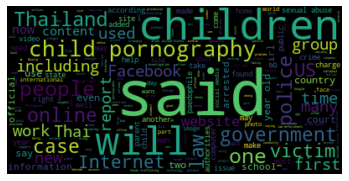

In [ ]:
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

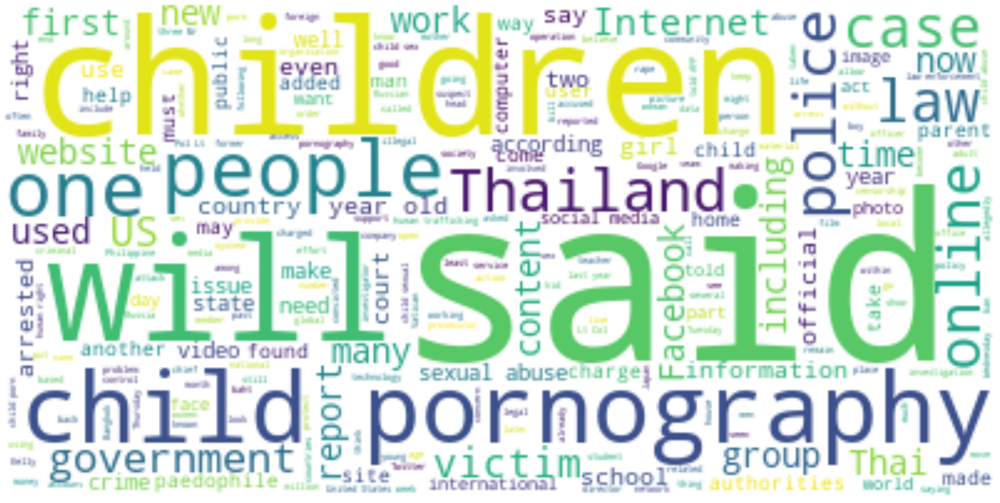

In [ ]:
# Create a word cloud image
wc = WordCloud(background_color="white", max_words=1000,
               contour_width=3, contour_color='yellow')      # stopwords=stopwords, contour_color='firebrick'

# Generate a wordcloud
wc.generate(all_texts)

# store to file
wc.to_file("BP_all_texts.png")

# show
plt.figure(figsize=[40,20])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

### Cleaning Datetime

In [ ]:
df['Date']

0                       published : 11 Sep 2020 at 09:45
1      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Au...
2      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t22 Ju...
3      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Ju...
4                       published : 15 Jul 2020 at 04:00
                             ...                        
321    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t1 Sep...
322    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Au...
323    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t4 Aug...
324                                                 None
325                                                 None
Name: Date, Length: 326, dtype: object

In [ ]:
df['Date'] = df['Date'].str.lstrip() # didn't change anything ;) ...

df['Date'] = df['Date'].str.rstrip('\t')

In [ ]:
df['Date'] = df['Date'].str.replace('\t', '')
df['Date'] = df['Date'].str.replace('\n', '')

In [ ]:
df['Date'] = df['Date'].str.replace('published :', '')

In [ ]:
df['Date'] = df['Date'].str.replace('at ', '')

In [ ]:
df['Date']

0       11 Sep 2020 09:45
1       18 Aug 2020 04:00
2       22 Jul 2020 22:45
3       18 Jul 2020 07:45
4       15 Jul 2020 04:00
              ...        
321      1 Sep 2010 00:00
322     18 Aug 2010 00:00
323      4 Aug 2010 00:00
324                  None
325                  None
Name: Date, Length: 326, dtype: object

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

In [ ]:
df['Date']

0     2020-09-11 09:45:00
1     2020-08-18 04:00:00
2     2020-07-22 22:45:00
3     2020-07-18 07:45:00
4     2020-07-15 04:00:00
              ...        
321   2010-09-01 00:00:00
322   2010-08-18 00:00:00
323   2010-08-04 00:00:00
324                   NaT
325                   NaT
Name: Date, Length: 326, dtype: datetime64[ns]

In [ ]:
# where do my 9 NAN come from ??

df['Date'].isna().sum()

32

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,2020-09-11 09:45:00,#CancelNetflix campaign heats up over 'Mignonnes',https://search.bangkokpost.com/track/visitAndR...,NEW YORK: Thousands of people launched a call ...
1,2020-08-18 04:00:00,\n\t\t\t\t\t\t\t\t\t\t\tDTAC joins effort to p...,https://search.bangkokpost.com/track/visitAndR...,"Total Access Communication (DTAC), the country..."
2,2020-07-22 22:45:00,\n\t\t\t\t\t\t\t\t\t\t\tRussia convicts Gulag ...,https://search.bangkokpost.com/track/visitAndR...,PETROZAVODSK (RUSSIA) - A Russian court on Wed...
3,2020-07-18 07:45:00,\n\t\t\t\t\t\t\t\t\t\t\tGermany's 'Black Fores...,https://search.bangkokpost.com/track/visitAndR...,"BERLIN - After a huge six-day manhunt, German ..."
4,2020-07-15 04:00:00,Body of Glee star Naya Rivera recovered from U...,https://search.bangkokpost.com/track/visitAndR...,US officials on Monday found the body of Glee ...


In [ ]:
copy=df

In [ ]:
copy = copy.set_index(copy['Date'])

In [ ]:
copy.head()

,Date,Title,Article_Link,Article
Date,,,,
2020-09-11 09:45:00,2020-09-11 09:45:00,#CancelNetflix campaign heats up over 'Mignonnes',https://search.bangkokpost.com/track/visitAndR...,NEW YORK: Thousands of people launched a call ...
2020-08-18 04:00:00,2020-08-18 04:00:00,\n\t\t\t\t\t\t\t\t\t\t\tDTAC joins effort to p...,https://search.bangkokpost.com/track/visitAndR...,"Total Access Communication (DTAC), the country..."
2020-07-22 22:45:00,2020-07-22 22:45:00,\n\t\t\t\t\t\t\t\t\t\t\tRussia convicts Gulag ...,https://search.bangkokpost.com/track/visitAndR...,PETROZAVODSK (RUSSIA) - A Russian court on Wed...
2020-07-18 07:45:00,2020-07-18 07:45:00,\n\t\t\t\t\t\t\t\t\t\t\tGermany's 'Black Fores...,https://search.bangkokpost.com/track/visitAndR...,"BERLIN - After a huge six-day manhunt, German ..."
2020-07-15 04:00:00,2020-07-15 04:00:00,Body of Glee star Naya Rivera recovered from U...,https://search.bangkokpost.com/track/visitAndR...,US officials on Monday found the body of Glee ...


In [ ]:
yearly = copy.resample("Y").count()

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2010-12-31,4,4,4,4
2011-12-31,10,10,10,10
2012-12-31,27,27,27,27
2013-12-31,33,33,33,33
2014-12-31,41,41,41,41
2015-12-31,43,43,43,43
2016-12-31,36,36,36,36
2017-12-31,20,20,20,20
2018-12-31,25,25,25,25


In [ ]:
yearly.index = yearly.index.year

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2010,4,4,4,4
2011,10,10,10,10
2012,27,27,27,27
2013,33,33,33,33
2014,41,41,41,41
2015,43,43,43,43
2016,36,36,36,36
2017,20,20,20,20
2018,25,25,25,25


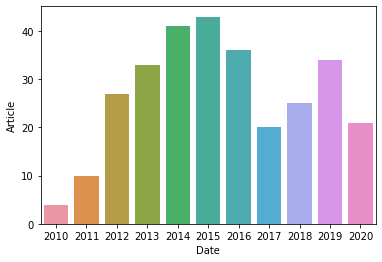

In [ ]:
# ATTENTION !!! these do NOT INCLUDE the 40 papers already scraped in R2!!! -> need to CONCATENATE THE 2 !!!!
sns.barplot(yearly.index,yearly.Article)

In [ ]:
df.isna().sum()

Unnamed: 0      0
Date            6
Title           0
Article_Link    0
Article         0
dtype: int64

In [ ]:
# could also be a string of 1 space or so. not necessarily missing value!

df.isnull().sum()     

Unnamed: 0      0
Date            6
Title           0
Article_Link    0
Article         0
dtype: int64

In [ ]:
from google.colab import files

df.to_csv('BP_ChildPornCleaned.csv')
files.download('BP_ChildPornCleaned.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/BP_ChildPornCleaned.csv?token=AN3DAR72RJ7JJ2URJ66X22K7OTOR6'
df = pd.read_csv(url)
df.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,2020-09-11 09:45:00,#CancelNetflix campaign heats up over 'Mignonnes',https://search.bangkokpost.com/track/visitAndR...,NEW YORK: Thousands of people launched a call ...
1,1,2020-08-18 04:00:00,\n\t\t\t\t\t\t\t\t\t\t\tDTAC joins effort to p...,https://search.bangkokpost.com/track/visitAndR...,"Total Access Communication (DTAC), the country..."
2,2,2020-07-22 22:45:00,\n\t\t\t\t\t\t\t\t\t\t\tRussia convicts Gulag ...,https://search.bangkokpost.com/track/visitAndR...,PETROZAVODSK (RUSSIA) - A Russian court on Wed...
3,3,2020-07-18 07:45:00,\n\t\t\t\t\t\t\t\t\t\t\tGermany's 'Black Fores...,https://search.bangkokpost.com/track/visitAndR...,"BERLIN - After a huge six-day manhunt, German ..."
4,4,2020-07-15 04:00:00,Body of Glee star Naya Rivera recovered from U...,https://search.bangkokpost.com/track/visitAndR...,US officials on Monday found the body of Glee ...


In [ ]:
df

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,2020-09-11 09:45:00,#CancelNetflix campaign heats up over 'Mignonnes',https://search.bangkokpost.com/track/visitAndR...,NEW YORK: Thousands of people launched a call ...
1,1,2020-08-18 04:00:00,\n\t\t\t\t\t\t\t\t\t\t\tDTAC joins effort to p...,https://search.bangkokpost.com/track/visitAndR...,"Total Access Communication (DTAC), the country..."
2,2,2020-07-22 22:45:00,\n\t\t\t\t\t\t\t\t\t\t\tRussia convicts Gulag ...,https://search.bangkokpost.com/track/visitAndR...,PETROZAVODSK (RUSSIA) - A Russian court on Wed...
3,3,2020-07-18 07:45:00,\n\t\t\t\t\t\t\t\t\t\t\tGermany's 'Black Fores...,https://search.bangkokpost.com/track/visitAndR...,"BERLIN - After a huge six-day manhunt, German ..."
4,4,2020-07-15 04:00:00,Body of Glee star Naya Rivera recovered from U...,https://search.bangkokpost.com/track/visitAndR...,US officials on Monday found the body of Glee ...
...,...,...,...,...,...
321,321,2010-09-01 00:00:00,\n\t\t\t\t\t\t\t\t\t\t\tThe importance of porn...,https://search.bangkokpost.com/track/visitAndR...,"The Internet owes a lot to porn, whether we ca..."
322,322,2010-08-18 00:00:00,\n\t\t\t\t\t\t\t\t\t\t\tCensorship versus secu...,https://search.bangkokpost.com/track/visitAndR...,"Freedom of speech, abuse of power by the gover..."
323,323,2010-08-04 00:00:00,\n\t\t\t\t\t\t\t\t\t\t\tLooking beyond the let...,https://search.bangkokpost.com/track/visitAndR...,Censorship is something that most of us detest...
324,324,NaN,404,https://search.bangkokpost.com/track/visitAndR...,NaN


In [ ]:
df_complete = df.loc[df.Article.isna()==False]

In [ ]:
df_complete.shape

(308, 5)

In [ ]:
df_complete['predictions_CP'] = text_clf.predict(df_complete.Article)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_complete['predictions_CP'].value_counts(dropna=False)

OVAC    301
PVAC      4
OVAA      3
Name: predictions_CP, dtype: int64

In [ ]:
df_complete.Article

0      NEW YORK: Thousands of people launched a call ...
1      Total Access Communication (DTAC), the country...
2      PETROZAVODSK (RUSSIA) - A Russian court on Wed...
3      BERLIN - After a huge six-day manhunt, German ...
4      US officials on Monday found the body of Glee ...
                             ...                        
318    Italian police on Friday warned of a new syste...
319    Trust. It's one of those things that takes for...
321    The Internet owes a lot to porn, whether we ca...
322    Freedom of speech, abuse of power by the gover...
323    Censorship is something that most of us detest...
Name: Article, Length: 308, dtype: object

In [ ]:
df_complete['CP_no_regex'] = df_complete.Article.str.contains('child pornography', regex=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_complete['CP_no_regex'].value_counts(dropna=False)

True     239
False     69
Name: CP_no_regex, dtype: int64

In [ ]:
df_complete['CP_and_combi'] = df_complete.Article.str.contains(('child' and 'pornography'), regex=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_complete['CP_and_combi'].value_counts(dropna=False)

True     301
False      7
Name: CP_and_combi, dtype: int64

In [ ]:
not_ChildPorn = df_complete.loc[df_complete['CP_and_combi'] =='False']
not_ChildPorn

/usr/local/lib/python3.6/dist-packages/pandas/core/ops/array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)


,Unnamed: 0,Date,Title,Article_Link,Article,CP_no_regex,CP_regex,CP_and_combi


## ADDING AUTOMATICALLY SCRAPED CHILD TRAFFICKING ALL (Dawid P.)

In [ ]:
links = pd.read_csv("BP_allTrafficking_DP.csv")

Date = []
Title = []
Article_Link = []
Article = []

# To track data loading
count = 0.0
total = len(links['links'])

for link in links['links']:
      time.sleep(1 + 3*random()) # between 1 and 4 seconds
      site = TheAge(link)
      Date.append(site.date)
      Title.append(site.title)
      Article_Link.append(link)
      Article.append(site.body)
      count += 1.0
      print('Load data at {}%'.format(round(100*(count/total),2)))

# Define a dictionary containing features of the data
# Convert it into DataFrame
df = pd.DataFrame({'Date':Date,
                   'Title':Title,
                   'Article_Link':Article_Link,
                   'Article':Article})

# Create a CSV file from the DataFrame
df.to_csv("BP_allTrafficking_DP_df.csv", index=False)

https://search.bangkokpost.com/track/visitAndRedirect?href=https%3A%2F%2Fwww.bangkokpost.com%2Flife%2Farts-and-entertainment%2F1989563%2Fa-look-at-netflixs-most-controversial-content&contentId=news1989563
Load data at 0.42%
https://search.bangkokpost.com/track/visitAndRedirect?href=https%3A%2F%2Fwww.bangkokpost.com%2Fworld%2F1958875%2Fpolice-search-german-allotment-garden-in-madeleine-mccann-case&contentId=news1958875
aqui 
published :
													28 Jul 2020 at 20:45												

Load data at 0.83%
https://search.bangkokpost.com/track/visitAndRedirect?href=https%3A%2F%2Fwww.bangkokpost.com%2Fworld%2F1956295%2Fdespite-twitter-crackdown-qanon-moves-into-conservative-mainstream&contentId=news1956295
aqui 
published :
													23 Jul 2020 at 10:45												

Load data at 1.25%
https://search.bangkokpost.com/track/visitAndRedirect?href=https%3A%2F%2Fwww.bangkokpost.com%2Fthailand%2Fgeneral%2F1937644%2Fonline-child-sex-abuse-nears-record-high-with-coronavirus&contentId=news1937644
aq

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,published : 22 Sep 2020 at 04:00,A look at Netflix's most controversial content,https://search.bangkokpost.com/track/visitAndR...,Netflix is facing backlash from viewers in sev...
1,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t28 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://search.bangkokpost.com/track/visitAndR...,BERLIN - Police are searching an allotment plo...
2,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t23 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tDespite Twitter crackd...,https://search.bangkokpost.com/track/visitAndR...,WASHINGTON - Twitter's decision to crack down ...
3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t19 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tOnline child sex abuse...,https://search.bangkokpost.com/track/visitAndR...,Online child sex abuse cases in Thailand are s...
4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Ju...,\n\t\t\t\t\t\t\t\t\t\t\t'Concrete evidence' th...,https://search.bangkokpost.com/track/visitAndR...,BERLIN - German prosecutors said Wednesday the...


In [ ]:
df.shape

(240, 4)

In [ ]:
from google.colab import files

df.to_csv('BP_ChildTrafficking_all.csv')
files.download('BP_ChildTrafficking_all.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
url = 'https://raw.githubusercontent.com/avocadosquirrel/SaveTheChildren_NLP/master/Bangkok_Post.csv?token=AN3DAR6FRP2BENORC6FF6TK7NHOVK'
df = pd.read_csv(url)
df.head()

,Unnamed: 0,Date,Title,Article_Link,Article
0,0,published : 13 Jul 2020 at 10:30,To catch an online predator,https://www.bangkokpost.com/life/social-and-li...,Sending a half-naked photo of herself to her n...
1,1,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t7 May...,\n\t\t\t\t\t\t\t\t\t\t\tOnline safety for chil...,https://www.bangkokpost.com/business/1459937/o...,"Shutting children away behind closed doors, aw..."
2,2,published : 8 Jan 2018 at 04:30,The predator next door,https://www.bangkokpost.com/life/social-and-li...,Enticed by the pretty face who sent him a Face...
3,3,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t23 Ju...,\n\t\t\t\t\t\t\t\t\t\t\tOnline task force clos...,https://www.bangkokpost.com/thailand/special-r...,A schoolboy came to the police with a broken h...
4,4,\npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t29 Ma...,\n\t\t\t\t\t\t\t\t\t\t\tPaedophile faces new c...,https://www.bangkokpost.com/thailand/general/4...,VANCOUVER - A former Canadian schoolteacher wh...


In [ ]:
# df['Article'].dropna()

0      NEW YORK: Thousands of people launched a call ...
1      Total Access Communication (DTAC), the country...
2      PETROZAVODSK (RUSSIA) - A Russian court on Wed...
3      BERLIN - After a huge six-day manhunt, German ...
4      US officials on Monday found the body of Glee ...
                             ...                        
318    Italian police on Friday warned of a new syste...
319    Trust. It's one of those things that takes for...
321    The Internet owes a lot to porn, whether we ca...
322    Freedom of speech, abuse of power by the gover...
323    Censorship is something that most of us detest...
Name: Article, Length: 308, dtype: object

In [ ]:
# join the 3 article texts one after another:

all_texts = ''
for text in df['Article'].dropna():
  all_texts += text

In [ ]:
all_texts

'Netflix is facing backlash from viewers in several countries following the recent release of award-winning film Cuties. Directed by Maïmouna Doucouré, the film has been criticised for sexualising young girls. This is not the first time Netflix has faced criticism in regards to its decision to air controversial films and series. In this list, we look at four other controversial films and series available on Netflix in Thailand. You can still watch them, following your own judgement. Cuties Cuties tells the story of 11-year-old girl Amy who rebels against her conservative family\'s traditions. As a result, the young girl decides to join a group of dancers named "The Cuties" at her school and becomes increasingly fascinated with the free-spirited dance crew, and starts to become aware of her burgeoning femininity. The film, criticised for sexualising young girls, won a directing award from the Sundance Institute in February. Though the movie is available in Thailand, its release has been

In [ ]:
len(all_texts)

892619

In [ ]:
# Python program to generate WordCloud 
  
# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 

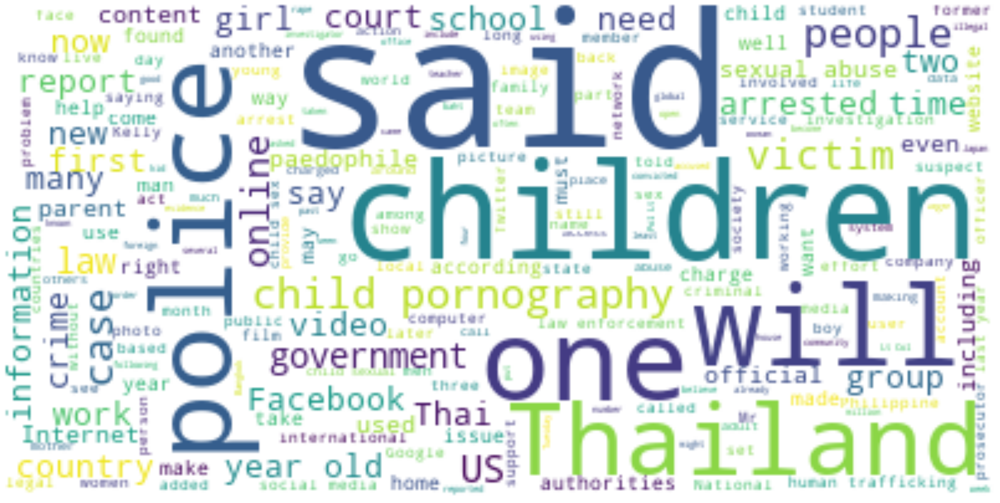

In [ ]:
# Create a word cloud image
wc = WordCloud(background_color="white", max_words=1000,
               contour_width=3, contour_color='yellow')      # stopwords=stopwords, contour_color='firebrick'

# Generate a wordcloud
wc.generate(all_texts)

# store to file
wc.to_file("BP_all_texts.png")

# show
plt.figure(figsize=[40,20])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

### Cleaning Datetime

In [ ]:
df['Date']

0                       published : 22 Sep 2020 at 04:00
1      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t28 Ju...
2      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t23 Ju...
3      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t19 Ju...
4      \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Ju...
                             ...                        
235    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Ma...
236    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t19 Fe...
237    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t18 Fe...
238    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t30 Ja...
239    \npublished :\n\t\t\t\t\t\t\t\t\t\t\t\t\t26 Ja...
Name: Date, Length: 240, dtype: object

In [ ]:
df['Date'] = df['Date'].str.lstrip() # didn't change anything ;) ...

df['Date'] = df['Date'].str.rstrip('\t')

In [ ]:
df['Date'] = df['Date'].str.replace('\t', '')
df['Date'] = df['Date'].str.replace('\n', '')

In [ ]:
df['Date'] = df['Date'].str.replace('published :', '')

In [ ]:
df['Date'] = df['Date'].str.replace('at ', '')

In [ ]:
df['Date']

0       22 Sep 2020 04:00
1       28 Jul 2020 20:45
2       23 Jul 2020 10:45
3       19 Jun 2020 08:37
4       18 Jun 2020 00:45
              ...        
235     18 Mar 2014 17:27
236     19 Feb 2014 13:49
237     18 Feb 2014 19:49
238     30 Jan 2014 01:49
239     26 Jan 2014 11:49
Name: Date, Length: 240, dtype: object

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

In [ ]:
df['Date']

0     2020-09-22 04:00:00
1     2020-07-28 20:45:00
2     2020-07-23 10:45:00
3     2020-06-19 08:37:00
4     2020-06-18 00:45:00
              ...        
235   2014-03-18 17:27:00
236   2014-02-19 13:49:00
237   2014-02-18 19:49:00
238   2014-01-30 01:49:00
239   2014-01-26 11:49:00
Name: Date, Length: 240, dtype: datetime64[ns]

In [ ]:
# where do my 9 NAN come from ??

df['Date'].isna().sum()

24

In [ ]:
df.head()

,Date,Title,Article_Link,Article
0,2020-09-22 04:00:00,A look at Netflix's most controversial content,https://search.bangkokpost.com/track/visitAndR...,Netflix is facing backlash from viewers in sev...
1,2020-07-28 20:45:00,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://search.bangkokpost.com/track/visitAndR...,BERLIN - Police are searching an allotment plo...
2,2020-07-23 10:45:00,\n\t\t\t\t\t\t\t\t\t\t\tDespite Twitter crackd...,https://search.bangkokpost.com/track/visitAndR...,WASHINGTON - Twitter's decision to crack down ...
3,2020-06-19 08:37:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline child sex abuse...,https://search.bangkokpost.com/track/visitAndR...,Online child sex abuse cases in Thailand are s...
4,2020-06-18 00:45:00,\n\t\t\t\t\t\t\t\t\t\t\t'Concrete evidence' th...,https://search.bangkokpost.com/track/visitAndR...,BERLIN - German prosecutors said Wednesday the...


In [ ]:
copy=df

In [ ]:
copy = copy.set_index(copy['Date'])

In [ ]:
copy.head()

,Date,Title,Article_Link,Article
Date,,,,
2020-09-22 04:00:00,2020-09-22 04:00:00,A look at Netflix's most controversial content,https://search.bangkokpost.com/track/visitAndR...,Netflix is facing backlash from viewers in sev...
2020-07-28 20:45:00,2020-07-28 20:45:00,\n\t\t\t\t\t\t\t\t\t\t\tPolice search German a...,https://search.bangkokpost.com/track/visitAndR...,BERLIN - Police are searching an allotment plo...
2020-07-23 10:45:00,2020-07-23 10:45:00,\n\t\t\t\t\t\t\t\t\t\t\tDespite Twitter crackd...,https://search.bangkokpost.com/track/visitAndR...,WASHINGTON - Twitter's decision to crack down ...
2020-06-19 08:37:00,2020-06-19 08:37:00,\n\t\t\t\t\t\t\t\t\t\t\tOnline child sex abuse...,https://search.bangkokpost.com/track/visitAndR...,Online child sex abuse cases in Thailand are s...
2020-06-18 00:45:00,2020-06-18 00:45:00,\n\t\t\t\t\t\t\t\t\t\t\t'Concrete evidence' th...,https://search.bangkokpost.com/track/visitAndR...,BERLIN - German prosecutors said Wednesday the...


In [ ]:
yearly = copy.resample("Y").count()

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2014-12-31,38,38,38,38
2015-12-31,43,43,43,43
2016-12-31,36,36,36,36
2017-12-31,20,20,20,20
2018-12-31,25,25,25,25
2019-12-31,34,34,34,34
2020-12-31,20,20,20,20


In [ ]:
yearly.index = yearly.index.year

In [ ]:
yearly

,Date,Title,Article_Link,Article
Date,,,,
2014,38,38,38,38
2015,43,43,43,43
2016,36,36,36,36
2017,20,20,20,20
2018,25,25,25,25
2019,34,34,34,34
2020,20,20,20,20


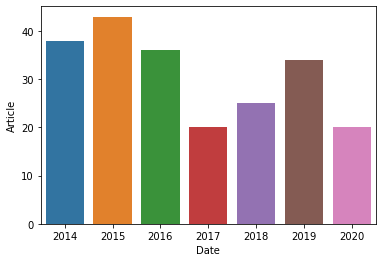

In [ ]:
# in child trafficking case, these results include ALL search results obtained from Bangkok Post! :)

sns.barplot(yearly.index,yearly.Article)

In [ ]:
df.isna().sum()

Date            24
Title            0
Article_Link     0
Article          9
dtype: int64

In [ ]:
# could also be a string of 1 space or so. not necessarily missing value!

df.isnull().sum()     

Unnamed: 0      0
Date            6
Title           0
Article_Link    0
Article         0
dtype: int64

In [ ]:
from google.colab import files

df.to_csv('BP_ChildTraffickingCleaned.csv')
files.download('BP_ChildTraffickingCleaned.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## SPACY & NER (GPE to detect COUNTRIES)

In [ ]:
import spacy
from spacy import displacy
from spacy.matcher import Matcher
from spacy.matcher import PhraseMatcher

import nltk
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Regular expression library already included in python :)
import re    

In [ ]:
nlp = spacy.load('en_core_web_sm')
#NLP = spacy.load('en_core_web_lg')  # why doesn't this work?

In [ ]:
df_complete.head()

,Date,Title,Article_Link,Article,predictions_CP
0,2020-09-11 09:45:00,#CancelNetflix campaign heats up over 'Mignonnes',https://search.bangkokpost.com/track/visitAndR...,NEW YORK: Thousands of people launched a call ...,OVAC
1,2020-08-18 04:00:00,\n\t\t\t\t\t\t\t\t\t\t\tDTAC joins effort to p...,https://search.bangkokpost.com/track/visitAndR...,"Total Access Communication (DTAC), the country...",OVAC
2,2020-07-22 22:45:00,\n\t\t\t\t\t\t\t\t\t\t\tRussia convicts Gulag ...,https://search.bangkokpost.com/track/visitAndR...,PETROZAVODSK (RUSSIA) - A Russian court on Wed...,OVAC
3,2020-07-18 07:45:00,\n\t\t\t\t\t\t\t\t\t\t\tGermany's 'Black Fores...,https://search.bangkokpost.com/track/visitAndR...,"BERLIN - After a huge six-day manhunt, German ...",OVAC
4,2020-07-15 04:00:00,Body of Glee star Naya Rivera recovered from U...,https://search.bangkokpost.com/track/visitAndR...,US officials on Monday found the body of Glee ...,OVAC


In [ ]:
doc1 = nlp(df_complete.Article[0])

In [ ]:
type(doc1)

spacy.tokens.doc.Doc

In [ ]:
#separate_lines = myfile.readlines()

In [ ]:
nlp.entity.add_label('GPE')
nlp.entity.add_label('ORG')

In [ ]:
for entity in doc1.ents:
  print(entity)
  print(entity.label_)
  print(str(spacy.explain(entity.label_)))
  print('/n')

NEW YORK
GPE
Countries, cities, states
/n
Thousands
CARDINAL
Numerals that do not fall under another type
/n
Netflix
GPE
Countries, cities, states
/n
Thursday
DATE
Absolute or relative dates or periods
/n
French
NORP
Nationalities or religious or political groups
/n
Mignonnes
WORK_OF_ART
Titles of books, songs, etc.
/n
English
LANGUAGE
Any named language
/n
French
NORP
Nationalities or religious or political groups
/n
Maimouna Doucoure
PERSON
People, including fictional
/n
September 9
DATE
Absolute or relative dates or periods
/n
More than 200,000
CARDINAL
Numerals that do not fall under another type
/n
CancelNetflix
PERSON
People, including fictional
/n
one day later
DATE
Absolute or relative dates or periods
/n
first
ORDINAL
"first", "second", etc.
/n
August
DATE
Absolute or relative dates or periods
/n
Netflix
GPE
Countries, cities, states
/n
that month
DATE
Absolute or relative dates or periods
/n
France
GPE
Countries, cities, states
/n
Netflix
PERSON
People, including fictional
/n

In [ ]:
df['Date'] = df['Date'].str.lstrip() 
df['Date'] = df['Date'].str.rstrip('\t')

df['Date'] = df['Date'].str.replace('\t', '')
df['Date'] = df['Date'].str.replace('\n', '')
df['Date'] = df['Date'].str.replace('published :', '')
df['Date'] = df['Date'].str.replace('at ', '')